In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as md
import h5py as h5
import os
import re
import random
import datetime
from matplotlib.colors import LogNorm
from matplotlib.ticker import FormatStrFormatter

In [8]:
df_fastpfor = pd.read_csv("logs/output_log_fastpfor_westsac.csv")
df_zfp = pd.read_csv("logs/output_log_zfp.csv")
df_sz = pd.read_csv("logs/output_log_sz.csv")

In [9]:
df_fastpfor['cmp_ratio'] = df_fastpfor['cmp_ratio'] / 4

In [14]:
df_fastpfor['cmp_ratio'].mean(), df_fastpfor['cmp_time'].mean()

(1.2240813475882646, 3036.8040775733466)

In [19]:
df_sz[df_sz['err_bound'] == 0.003]['cmp_ratio'].mean()

3.725542166666665

In [37]:
df_zfp['rmse_norm'] = df_zfp['rmse'] / df_zfp['abs_mean_uncmp']
df_zfp.groupby('rate').mean()

,prec,cmp_ratio,rmse,abs_mean_uncmp,min_uncmp,max_uncmp,mean_uncmp,min_decmp,max_decmp,mean_dcmp,cmp_time,decmp_time,Unnamed: 14,rmse_norm
rate,,,,,,,,,,,,,,
8,0.0,1.970590,4.122109,96.619321,-3586.908333,3614.941667,-0.605671,-3591.116667,3622.558333,-1.752483,394.400000,225.050000,NaN,0.043397
9,0.0,1.751630,2.532311,96.619321,-3586.908333,3614.941667,-0.605671,-3588.958333,3616.191667,-1.633180,403.841667,241.491667,NaN,0.026877
10,0.0,1.576470,2.060996,96.619321,-3586.908333,3614.941667,-0.605671,-3587.416667,3614.850000,-1.606645,404.083333,240.283333,NaN,0.022130
11,0.0,1.433160,1.996707,96.619321,-3586.908333,3614.941667,-0.605671,-3587.950000,3613.833333,-1.603540,404.841667,234.766667,NaN,0.021530
12,0.0,1.313730,1.990577,96.619321,-3586.908333,3614.941667,-0.605671,-3587.783333,3614.250000,-1.603242,398.300000,241.441667,NaN,0.021477
13,0.0,1.212670,1.990132,96.619321,-3586.908333,3614.941667,-0.605671,-3587.775000,3614.000000,-1.603218,413.066667,245.133333,NaN,0.021474
14,0.0,1.126050,1.990111,96.619321,-3586.908333,3614.941667,-0.605671,-3587.758333,3613.966667,-1.603218,413.566667,225.766667,NaN,0.021474
15,0.0,1.050980,1.990111,96.619321,-3586.908333,3614.941667,-0.605671,-3587.758333,3613.966667,-1.603218,427.800000,234.066667,NaN,0.021474
16,0.0,0.985294,1.990111,96.619321,-3586.908333,3614.941667,-0.605671,-3587.758333,3613.966667,-1.603218,427.408333,225.358333,NaN,0.021474


In [38]:
df_sz['rmse_norm'] = df_sz['rmse'] / df_sz['abs_mean_uncmp']
df_sz.groupby('err_bound').mean()

,best_cmp,best_speed,cmp_ratio,rmse,abs_mean_uncmp,min_uncmp,max_uncmp,mean_uncmp,min_decmp,max_decmp,mean_dcmp,cmp_time,decmp_time,Unnamed: 16,rmse_norm
err_bound,,,,,,,,,,,,,,,
0.0001,1.0,0.0,1.747859,0.729589,96.619321,-3586.908333,3614.941667,-0.605671,-3586.658333,3614.558333,-0.602984,650.975000,329.783333,NaN,0.007805
0.0005,1.0,0.0,2.317329,2.149724,96.619321,-3586.908333,3614.941667,-0.605671,-3586.491667,3614.708333,-0.602957,564.050000,260.291667,NaN,0.022195
0.0010,1.0,0.0,2.712694,4.176956,96.619321,-3586.908333,3614.941667,-0.605671,-3586.083333,3615.241667,-0.603563,544.925000,241.850000,NaN,0.043010
0.0015,1.0,0.0,3.018503,6.231004,96.619321,-3586.908333,3614.941667,-0.605671,-3586.508333,3615.025000,-0.602936,508.191667,225.050000,NaN,0.064112
0.0020,1.0,0.0,3.279117,8.291023,96.619321,-3586.908333,3614.941667,-0.605671,-3586.791667,3614.441667,-0.603691,500.900000,224.491667,NaN,0.085304
0.0025,1.0,0.0,3.506077,10.355667,96.619321,-3586.908333,3614.941667,-0.605671,-3584.891667,3614.975000,-0.603383,499.450000,220.258333,NaN,0.106532
0.0030,1.0,0.0,3.725542,12.426288,96.619321,-3586.908333,3614.941667,-0.605671,-3586.033333,3616.333333,-0.604782,474.383333,207.283333,NaN,0.127822


# FastPFor Analysis

In [2]:
df_mbari = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_mbari.csv")
df_fairbanks = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_fairbanks.csv")
df_imperial = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_imperial.csv")
df_westsac = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_westsac.csv")
df_30min = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_30min.csv")
df_events = pd.read_csv("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/logs/output_log_fastpfor_events.csv")
#df_westsac = pd.read_csv("../logs/output_log_fastpfor.csv")

In [3]:
np.mean(df_imperial['cmp_ratio']), np.mean(df_mbari['cmp_ratio']), np.mean(df_fairbanks['cmp_ratio']), np.mean(df_westsac['cmp_ratio']), np.mean(df_30min['cmp_ratio']), np.mean(df_events['cmp_ratio'])

(4.247035408000008,
 4.548629394893319,
 4.818322678034113,
 4.896325390353058,
 4.898303980582524,
 4.240435454545454)

In [13]:
df_events

,file_name,cmp_ratio,abs_mean_uncmp,std_dev,min_uncmp,max_uncmp,mean_uncmp,cmp_time,read_time,write_time,tot_time,Unnamed: 11
0,DF__UTC_20201119_170032/DF__UTC_20201119_17003...,4.24761,478.950,793.508,-24349,24495,-0.196448,1704,8877,271,20441,NaN
1,DF__UTC_20201117_105132/DF__UTC_20201117_10513...,4.24815,423.532,712.971,-22595,21502,-0.272916,1695,8965,269,20509,NaN
2,DF__UTC_20201118_120832/DF__UTC_20201118_12083...,4.23576,902.329,1825.810,-24981,25009,0.078220,1789,8530,490,20560,NaN
3,DF__UTC_20201119_233232/DF__UTC_20201119_23323...,4.24689,486.450,841.429,-24883,24846,-0.593323,1740,8066,1016,20585,NaN
4,DF__UTC_20201113_055632/DF__UTC_20201113_05563...,4.24090,894.389,1587.360,-24847,25279,0.063289,1759,8805,1896,22236,NaN
5,DF__UTC_20201113_033532/DF__UTC_20201113_03353...,4.24770,403.445,695.090,-24425,24572,-0.215998,1694,8528,2431,22253,NaN
6,DF__UTC_20201205_054132/DF__UTC_20201205_05413...,4.24809,424.411,704.400,-23310,22213,-0.048140,1696,8740,2193,22260,NaN
7,DF__UTC_20201122_191432/DF__UTC_20201122_19143...,4.24823,376.690,635.597,-22683,21222,0.012274,1681,8941,2182,22393,NaN
8,DF__UTC_20201128_084332/DF__UTC_20201128_08433...,4.24825,386.812,646.236,-22551,22193,-0.060408,1703,8961,2397,22661,NaN
9,DF__UTC_20201205_195332/DF__UTC_20201205_19533...,4.24771,484.193,793.719,-24071,23918,-0.213463,1706,13295,1905,26081,NaN


In [6]:
df_mbari = df_mbari.sort_values(by='file_name')
df_mbari['date'] = pd.to_datetime(df_mbari['file_name'].apply(lambda x: x[14:29]).str.replace('_', '')) - pd.Timedelta('8 hours')
df_mbari['range'] = df_mbari['max_uncmp'] - df_mbari['min_uncmp']
df_fairbanks = df_fairbanks.sort_values(by='file_name')
df_fairbanks['date'] = pd.to_datetime(df_fairbanks['file_name'].apply(lambda x: x[6:18]), format='%y%m%d%H%M%S') - pd.Timedelta('9 hours')
df_fairbanks['range'] = df_fairbanks['max_uncmp'] - df_fairbanks['min_uncmp']
df_imperial = df_imperial.sort_values(by='file_name')
df_imperial['date'] = pd.to_datetime(df_imperial['file_name'].apply(lambda x: x[7:22].replace('_', '')), format='%Y%m%d%H%M%S') - pd.Timedelta('8 hours')
df_imperial['range'] = df_imperial['max_uncmp'] - df_imperial['min_uncmp']
df_westsac = df_westsac.sort_values(by='file_name')
df_westsac['date'] = pd.to_datetime(df_westsac['file_name'].apply(lambda x: x[8:20]), format='%y%m%d%H%M%S')
df_westsac['range'] = df_westsac['max_uncmp'] - df_westsac['min_uncmp']
df_30min = df_30min.sort_values(by='file_name')
df_30min['date'] = pd.to_datetime(df_30min['file_name'].apply(lambda x: x[10:22]), format='%y%m%d%H%M%S')
df_30min['range'] = df_30min['max_uncmp'] - df_30min['min_uncmp']
df_30min

,file_name,cmp_ratio,abs_mean_uncmp,std_dev,min_uncmp,max_uncmp,mean_uncmp,cmp_time,read_time,write_time,tot_time,Unnamed: 11,date,range
6,Dsi_30min_170803000007_170803003007_ch5500_600...,4.89813,112.6900,168.004,-6162,6098,-0.322617,4350,45275,587,76303,NaN,2017-08-03 00:00:07,12260
8,Dsi_30min_170803003007_170803010007_ch5500_600...,4.89831,107.9950,156.167,-6210,6071,-0.808891,4336,45407,645,76323,NaN,2017-08-03 00:30:07,12281
5,Dsi_30min_170803010007_170803013007_ch5500_600...,4.89860,102.2100,140.868,-6026,6170,-0.534913,4344,45229,553,76271,NaN,2017-08-03 01:00:07,12196
0,Dsi_30min_170803013007_170803020007_ch5500_600...,4.89858,97.3796,136.163,-6057,6094,-0.650796,4222,44577,634,74467,NaN,2017-08-03 01:30:07,12151
4,Dsi_30min_170803020007_170803023007_ch5500_600...,4.89868,99.9760,135.255,-5958,6189,-0.687519,4296,45137,558,76251,NaN,2017-08-03 02:00:07,12147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,Dsi_30min_170807020056_170807023056_ch5500_600...,4.89868,98.1661,130.419,-6026,5908,-0.050862,4248,45357,538,74686,NaN,2017-08-07 02:00:56,11934
99,Dsi_30min_170807023056_170807030056_ch5500_600...,4.89866,96.8879,129.970,-6151,6056,-0.631446,4291,45417,547,74956,NaN,2017-08-07 02:30:56,12207
100,Dsi_30min_170807030056_170807033056_ch5500_600...,4.89876,95.7256,125.911,-5647,6109,-1.329690,3567,40643,486,65572,NaN,2017-08-07 03:00:56,11756
101,Dsi_30min_170807033056_170807040056_ch5500_600...,4.89874,95.2987,125.035,-6113,5730,-0.592298,3561,38149,478,62453,NaN,2017-08-07 03:30:56,11843


In [20]:
df_full = pd.concat([df_mbari, df_fairbanks, df_imperial, df_westsac, df_30min])
df_full

,file_name,cmp_ratio,abs_mean_uncmp,std_dev,min_uncmp,max_uncmp,mean_uncmp,cmp_time,read_time,write_time,tot_time,Unnamed: 11,date,range
9,mbari2019_UTC_20190622_001034/mbari2019_UTC_20...,4.24841,581.2360,758.025,-19336,23695,-4.713050,1177,6219,1434,15806,NaN,2019-06-21 16:10:34,43031
7,mbari2019_UTC_20190622_001104/mbari2019_UTC_20...,4.55045,584.3630,761.305,-11102,10637,-4.786930,1158,6108,552,14719,NaN,2019-06-21 16:11:04,21739
5,mbari2019_UTC_20190622_001134/mbari2019_UTC_20...,4.55038,578.6650,750.361,-11897,11056,-4.680600,1191,6238,204,14607,NaN,2019-06-21 16:11:34,22953
3,mbari2019_UTC_20190622_001204/mbari2019_UTC_20...,4.55175,570.7790,744.159,-9787,11324,-4.861480,1158,6123,209,14410,NaN,2019-06-21 16:12:04,21111
0,mbari2019_UTC_20190622_001234/mbari2019_UTC_20...,4.55053,558.6750,729.826,-10548,10271,-4.859200,1131,5847,276,14173,NaN,2019-06-21 16:12:34,20819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,Dsi_30min_170807020056_170807023056_ch5500_600...,4.89868,98.1661,130.419,-6026,5908,-0.050862,4248,45357,538,74686,NaN,2017-08-07 02:00:56,11934
99,Dsi_30min_170807023056_170807030056_ch5500_600...,4.89866,96.8879,129.970,-6151,6056,-0.631446,4291,45417,547,74956,NaN,2017-08-07 02:30:56,12207
100,Dsi_30min_170807030056_170807033056_ch5500_600...,4.89876,95.7256,125.911,-5647,6109,-1.329690,3567,40643,486,65572,NaN,2017-08-07 03:00:56,11756
101,Dsi_30min_170807033056_170807040056_ch5500_600...,4.89874,95.2987,125.035,-6113,5730,-0.592298,3561,38149,478,62453,NaN,2017-08-07 03:30:56,11843


In [9]:
import scipy as sp
import scipy.stats as stats


%matplotlib inline


def plot_ci_manual(t, s_err, n, x, x2, y2, ax=None):
    """Return an axes of confidence bands using a simple approach.

    Notes
    -----
    .. math:: \left| \: \hat{\mu}_{y|x0} - \mu_{y|x0} \: \right| \; \leq \; T_{n-2}^{.975} \; \hat{\sigma} \; \sqrt{\frac{1}{n}+\frac{(x_0-\bar{x})^2}{\sum_{i=1}^n{(x_i-\bar{x})^2}}}
    .. math:: \hat{\sigma} = \sqrt{\sum_{i=1}^n{\frac{(y_i-\hat{y})^2}{n-2}}}

    References
    ----------
    .. [1] M. Duarte.  "Curve fitting," Jupyter Notebook.
       http://nbviewer.ipython.org/github/demotu/BMC/blob/master/notebooks/CurveFitting.ipynb

    """
    if ax is None:
        ax = plt.gca()

    ci = t * s_err * np.sqrt(1/n + (x2 - np.mean(x))**2 / np.sum((x - np.mean(x))**2))
    ax.fill_between(x2, y2 + ci, y2 - ci, color="#b9cfe7", edgecolor="")

    return ax


def plot_ci_bootstrap(xs, ys, resid, nboot=500, ax=None):
    """Return an axes of confidence bands using a bootstrap approach.

    Notes
    -----
    The bootstrap approach iteratively resampling residuals.
    It plots `nboot` number of straight lines and outlines the shape of a band.
    The density of overlapping lines indicates improved confidence.

    Returns
    -------
    ax : axes
        - Cluster of lines
        - Upper and Lower bounds (high and low) (optional)  Note: sensitive to outliers

    References
    ----------
    .. [1] J. Stults. "Visualizing Confidence Intervals", Various Consequences.
       http://www.variousconsequences.com/2010/02/visualizing-confidence-intervals.html

    """ 
    if ax is None:
        ax = plt.gca()

    bootindex = sp.random.randint

    for _ in range(nboot):
        resamp_resid = resid[bootindex(0, len(resid) - 1, len(resid))]
        # Make coeffs of for polys
        pc = sp.polyfit(xs, ys + resamp_resid, 1)                   
        # Plot bootstrap cluster
        ax.plot(xs, sp.polyval(pc, xs), "b-", linewidth=2, alpha=3.0 / float(nboot))

    return ax

In [10]:
# Modeling with Numpy
def equation(a, b):
    """Return a 1D polynomial."""
    return np.polyval(a, b) 

def plot_bootstrap(df, title):
    # Computations ----------------------------------------------------------------
    # Raw Data
    
    x = df['std_dev']
    y = df['cmp_ratio']

    p, cov = np.polyfit(x, y, 1, cov=True)                     # parameters and covariance from of the fit of 1-D polynom.
    y_model = equation(p, x)                                   # model using the fit parameters; NOTE: parameters here are coefficients

    # Statistics
    n = y.size                                           # number of observations
    m = p.size                                                 # number of parameters
    dof = n - m                                                # degrees of freedom
    t = stats.t.ppf(0.975, n - m)                              # used for CI and PI bands

    # Estimates of Error in Data/Model
    resid = y - y_model                           
    chi2 = np.sum((resid / y_model)**2)                        # chi-squared; estimates error in data
    chi2_red = chi2 / dof                                      # reduced chi-squared; measures goodness of fit
    s_err = np.sqrt(np.sum(resid**2) / dof)                    # standard deviation of the error
    
    
    # Plotting --------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Data
    ax.plot(
        x, y, ".", color="#b9cfe7", markersize=5, 
        markeredgewidth=1, markeredgecolor="b", markerfacecolor="None"
    )
    
    # Fit
    ax.plot(x, y_model, "-", color="0.1", linewidth=1.5, alpha=0.5, label="Fit")  
    
    x2 = np.linspace(np.min(x), np.max(x), 100)
    y2 = equation(p, x2)
    
    # Confidence Interval (select one)
    plot_ci_manual(t, s_err, n, x, x2, y2, ax=ax)
    #plot_ci_bootstrap(x, y, resid, ax=ax)
    
    # Prediction Interval
    pi = t * s_err * np.sqrt(1 + 1/n + (x2 - np.mean(x))**2 / np.sum((x - np.mean(x))**2))   
    ax.fill_between(x2, y2 + pi, y2 - pi, color="None", linestyle="--")
    ax.plot(x2, y2 - pi, "--", color="0.5", label="95% Prediction Limits")
    ax.plot(x2, y2 + pi, "--", color="0.5")
    
    
    # Figure Modifications --------------------------------------------------------
    # Borders
    ax.spines["top"].set_color("0.5")
    ax.spines["bottom"].set_color("0.5")
    ax.spines["left"].set_color("0.5")
    ax.spines["right"].set_color("0.5")
    ax.get_xaxis().set_tick_params(direction="out")
    ax.get_yaxis().set_tick_params(direction="out")
    ax.xaxis.tick_bottom()
    ax.yaxis.tick_left() 
    
    # Labels
    plt.title(title, fontsize="14", fontweight="bold")
    plt.xlabel("Standard Deviation")
    plt.ylabel("Compression Ratio")
    plt.xlim(np.min(x) - 1, np.max(x) + 1)
    
    # Custom legend
    handles, labels = ax.get_legend_handles_labels()
    display = (0, 1)
    anyArtist = plt.Line2D((0, 1), (0, 0), color="#b9cfe7")    # create custom artists
    legend = plt.legend(
        [handle for i, handle in enumerate(handles) if i in display] + [anyArtist],
        [label for i, label in enumerate(labels) if i in display] + ["95% Confidence Limits"],
        loc=9, bbox_to_anchor=(0, -0.21, 1., 0.102), ncol=3, mode="expand"
    )  
    frame = legend.get_frame().set_edgecolor("0.5")
    
    # Save Figure
    plt.tight_layout()
    plt.savefig("filename.png", bbox_extra_artists=(legend,), bbox_inches="tight")
    
    plt.show()
    print(np.corrcoef(x, y))

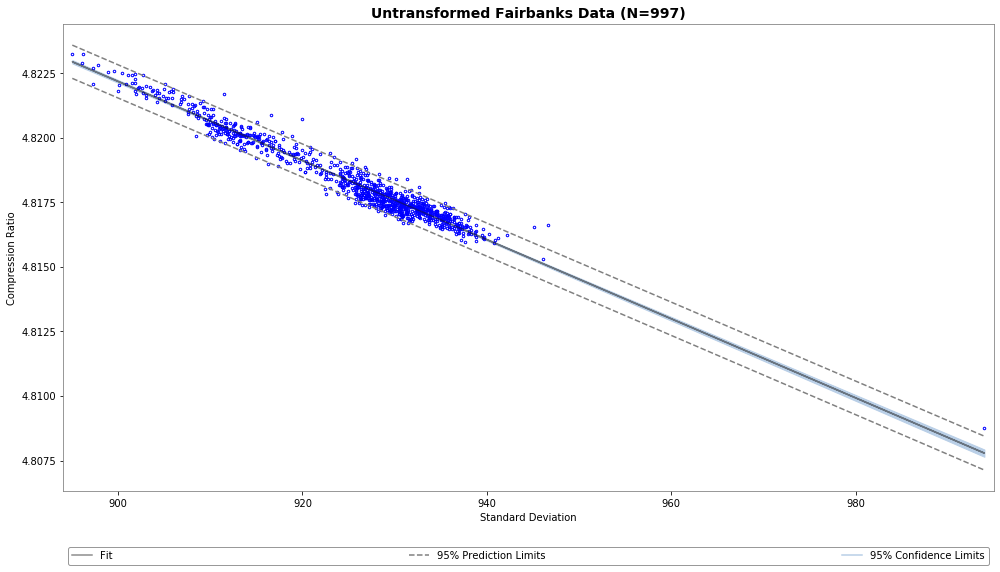

[[ 1.         -0.97784415]
 [-0.97784415  1.        ]]


In [25]:
plot_bootstrap(df_fairbanks, "Untransformed Fairbanks Data (N=997)")

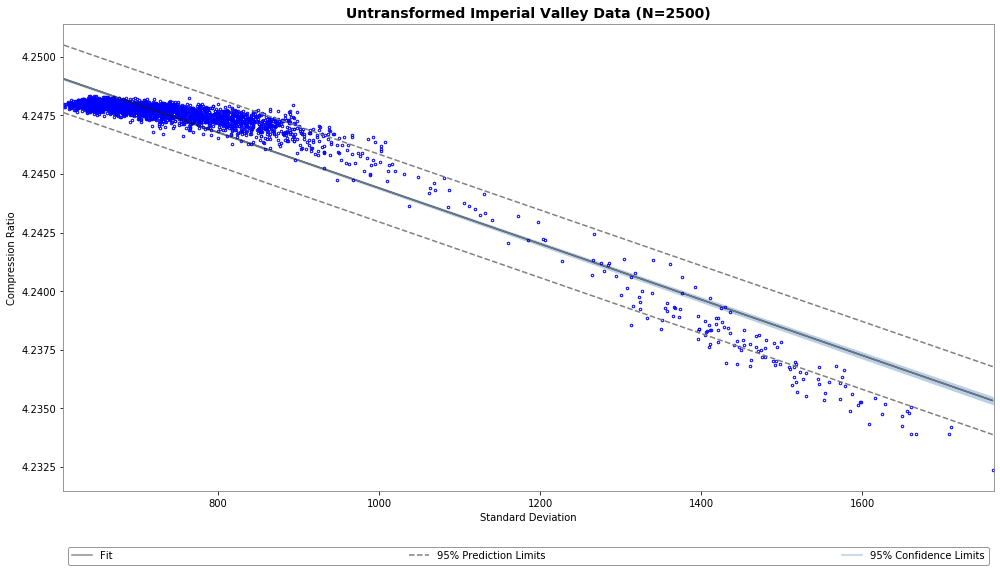

[[ 1.         -0.94984049]
 [-0.94984049  1.        ]]


In [26]:
plot_bootstrap(df_imperial, "Untransformed Imperial Valley Data (N=2500)")

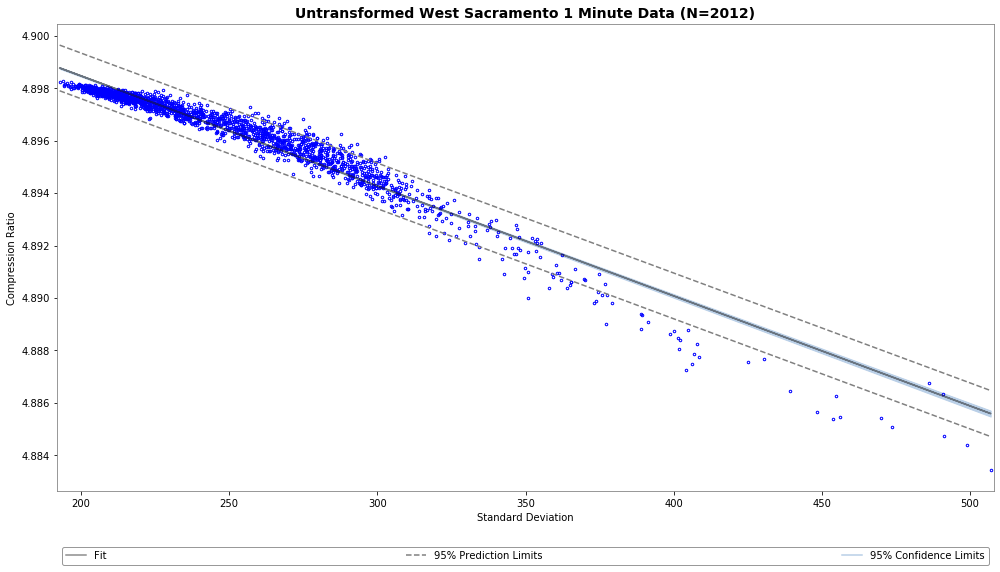

[[ 1.         -0.97230728]
 [-0.97230728  1.        ]]


In [18]:
plot_bootstrap(df_westsac, "Untransformed West Sacramento 1 Minute Data (N=2012)")

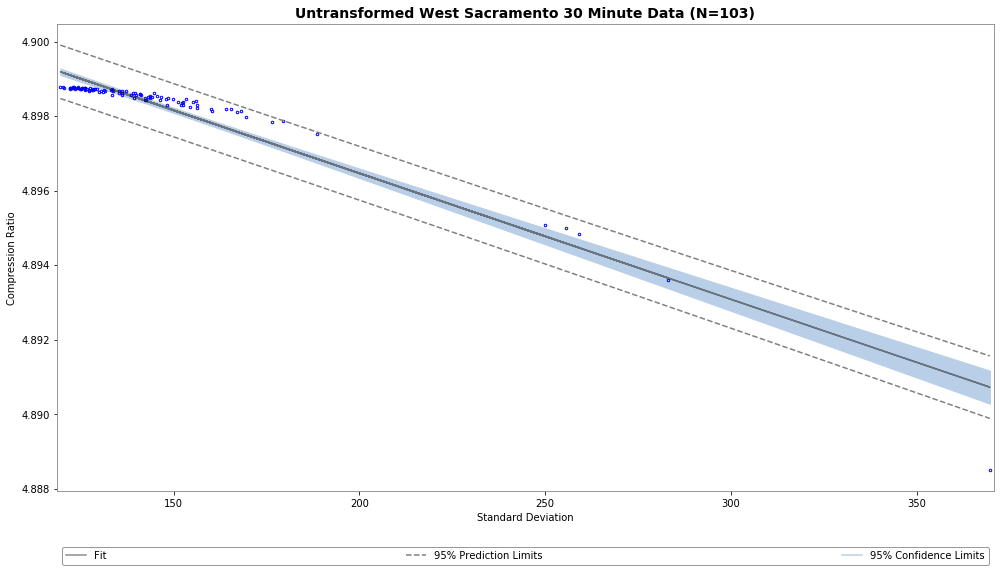

[[ 1.         -0.95942989]
 [-0.95942989  1.        ]]


In [28]:
plot_bootstrap(df_30min, "Untransformed West Sacramento 30 Minute Data (N=103)")

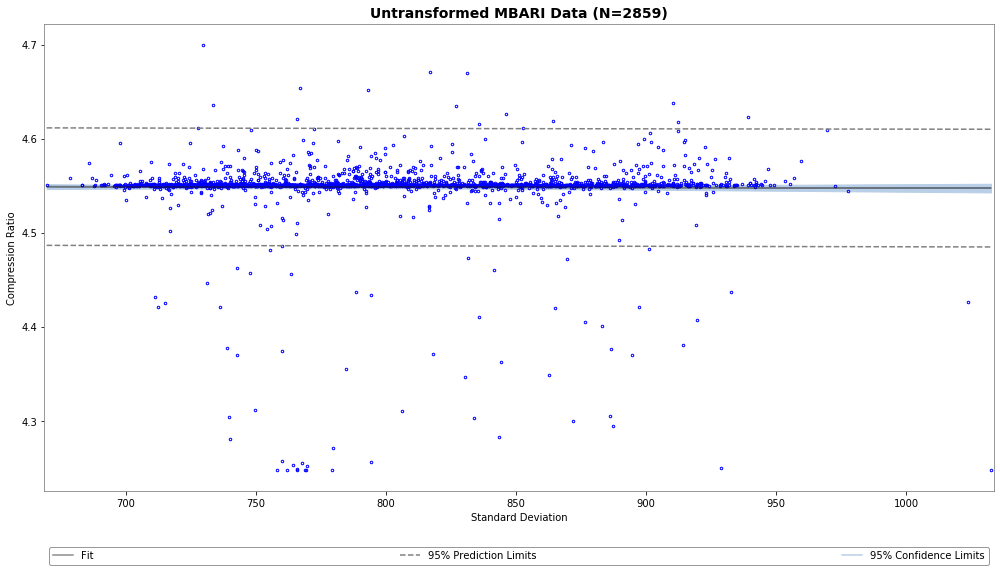

[[ 1.         -0.00841769]
 [-0.00841769  1.        ]]


In [29]:
plot_bootstrap(df_mbari, "Untransformed MBARI Data (N=2859)")

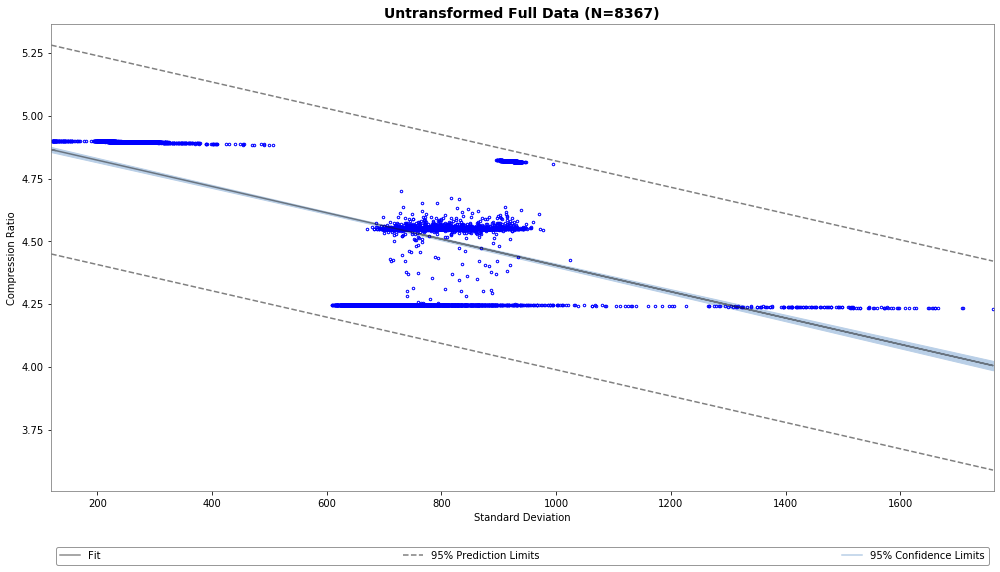

[[ 1.         -0.55637512]
 [-0.55637512  1.        ]]


In [30]:
plot_bootstrap(df_full, "Untransformed Full Data (N=8367)")

In [31]:
def plot_time(df, title):
    fig, ax = plt.subplots(figsize=(20,12))

    plt.scatter('date', 'cmp_ratio', data=df)
    ax.set_xlim(df['date'].min()-pd.Timedelta(1,'h'),
                df['date'].max()+pd.Timedelta(1,'h'))

    ax.xaxis.set_major_locator(md.HourLocator(interval = 1))
    ax.xaxis.set_major_formatter(md.DateFormatter('%H:%M:%S'))
    ax.set_xlabel('Time')
    ax.set_ylabel('Compression Ratio')
    plt.title(title)
    plt.style.use('seaborn')

    fig.autofmt_xdate()

    plt.show()  

/usr/common/software/python/3.7-anaconda-2019.10/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


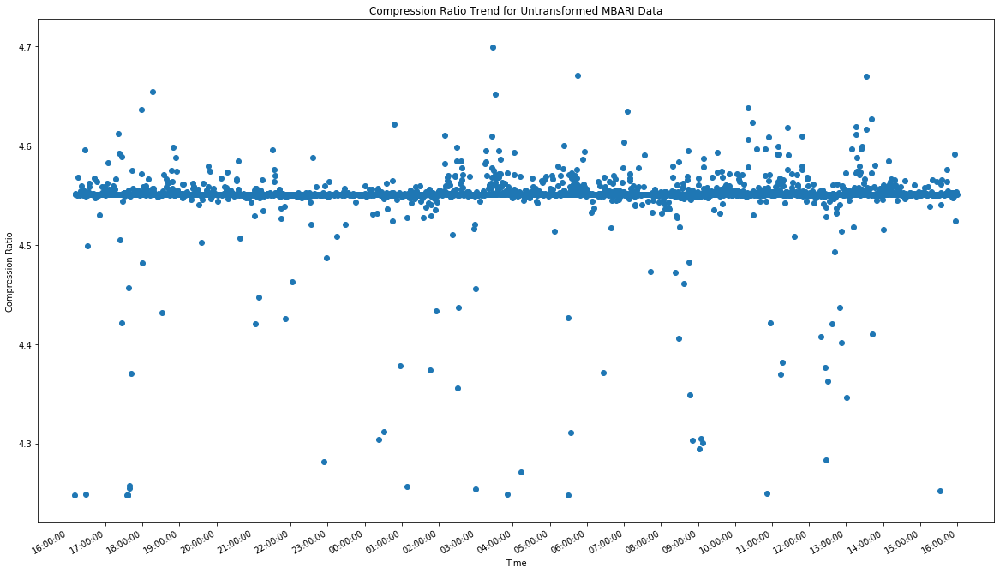

In [32]:
plot_time(df_mbari, 'Compression Ratio Trend for Untransformed MBARI Data')

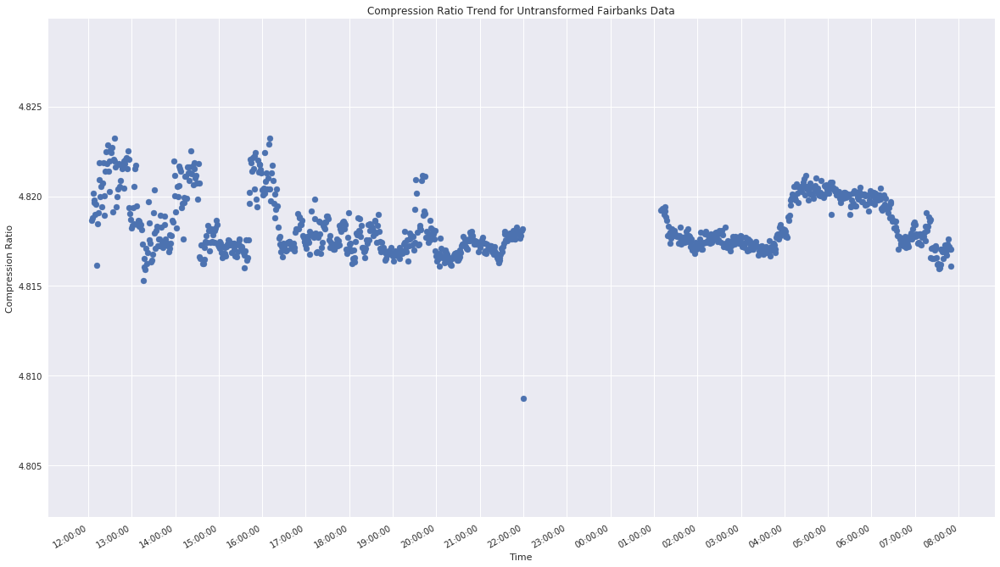

In [33]:
plot_time(df_fairbanks, 'Compression Ratio Trend for Untransformed Fairbanks Data')

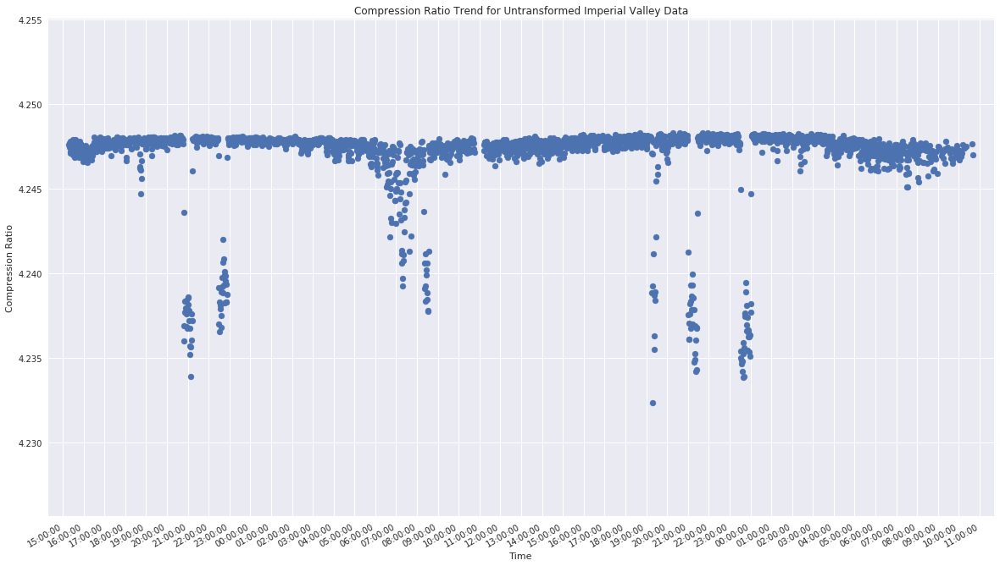

In [34]:
plot_time(df_imperial, 'Compression Ratio Trend for Untransformed Imperial Valley Data')

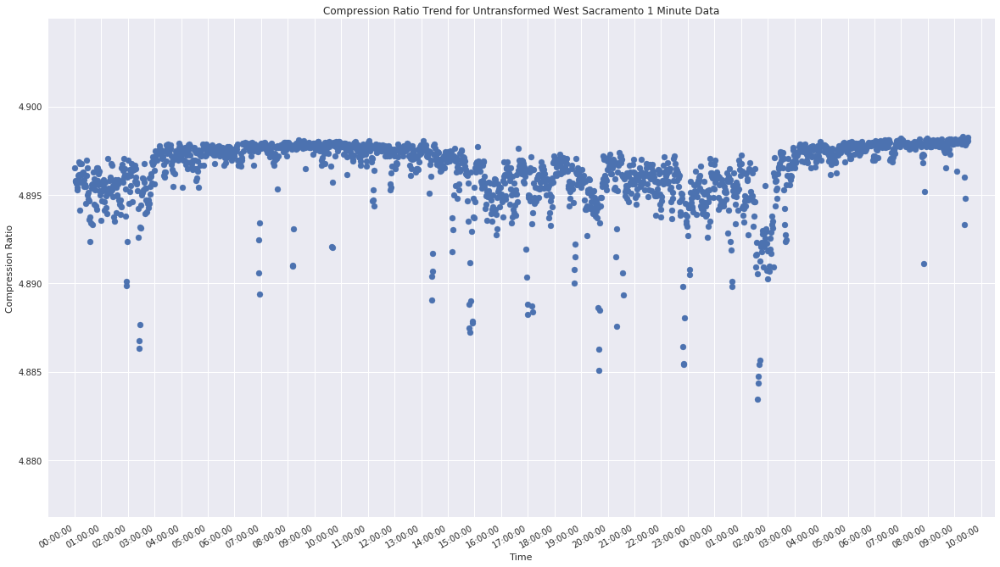

In [38]:
plot_time(df_westsac, 'Compression Ratio Trend for Untransformed West Sacramento 1 Minute Data')

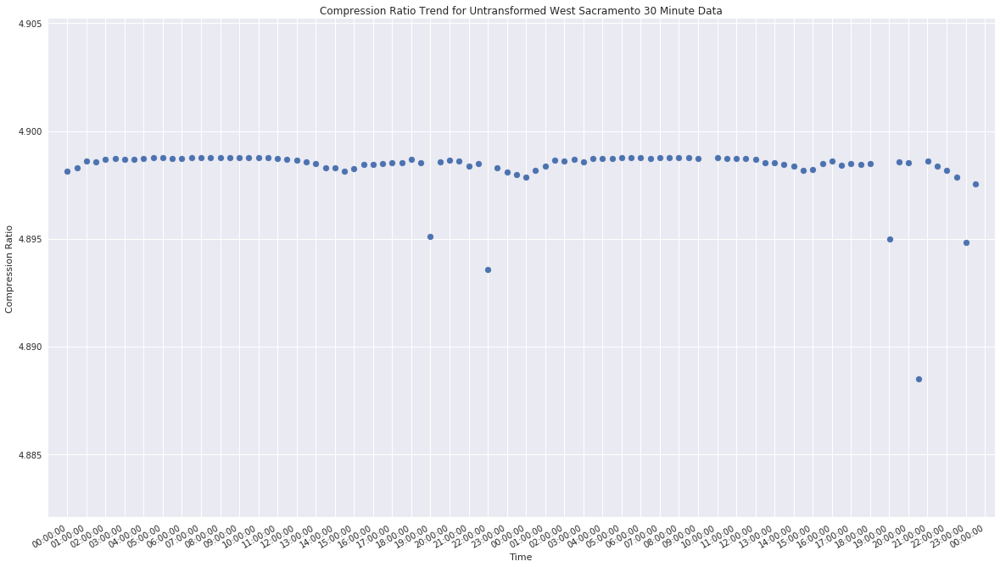

In [42]:
plot_time(df_30min.iloc[:94, :], 'Compression Ratio Trend for Untransformed West Sacramento 30 Minute Data')

In [55]:
def cr_hist(df_list, titles):
    f, axarr = plt.subplots(1, 5, figsize=(20, 5))
    plt.subplots_adjust(wspace=0.5)
    f.suptitle('Compression Ratio Histograms', fontsize=16)
    idx = 0
    for df, title in zip(df_list, titles):
        mn, mx = min(df['cmp_ratio']), max(df['cmp_ratio'])
        axarr[idx].hist(df['cmp_ratio'], bins=np.linspace(mn, mx, 40))
        axarr[idx].axvline(x=np.mean(df['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df['cmp_ratio']), 2)), lw=0.75)
        axarr[idx].set_xlabel('Compression Ratio')
        axarr[idx].set_ylabel('Count')
        axarr[idx].set_xlim(mn, mx)
        axarr[idx].set_title(title)
        axarr[idx].legend()
        axarr[idx].xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        idx += 1

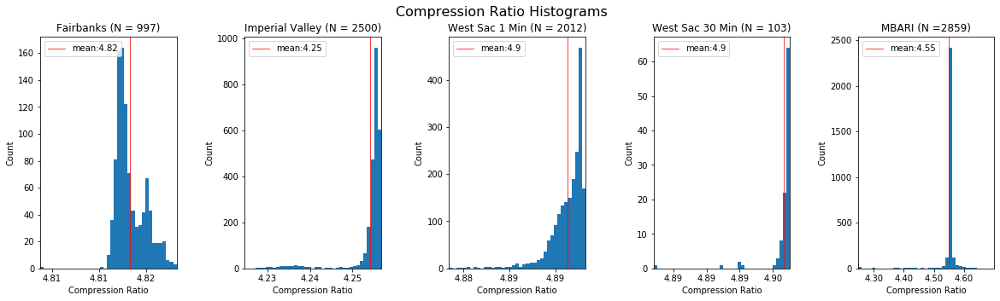

In [56]:
cr_hist([df_fairbanks, df_imperial, df_westsac, df_30min, df_mbari], ['Fairbanks (N = 997)', 'Imperial Valley (N = 2500)', 
                                                                      'West Sac 1 Min (N = 2012)', 'West Sac 30 Min (N = 103)',
                                                                      'MBARI (N =2859)'])

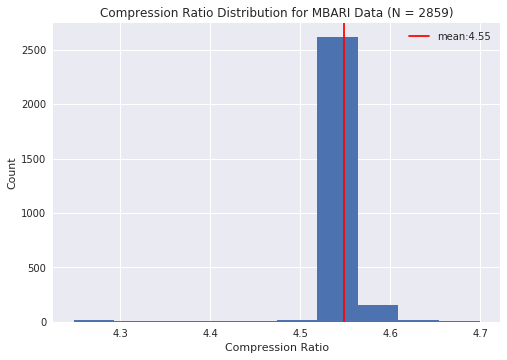

In [43]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(df_mbari['cmp_ratio'])
plt.axvline(x=np.mean(df_mbari['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df_mbari['cmp_ratio']), 2)))
ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Count')
plt.title('Compression Ratio Distribution for MBARI Data (N = 2859)')
plt.style.use('seaborn')
plt.legend()
plt.show()

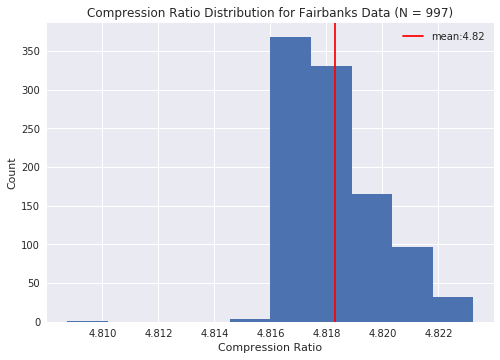

In [44]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(df_fairbanks['cmp_ratio'])
plt.axvline(x=np.mean(df_fairbanks['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df_fairbanks['cmp_ratio']), 2)))
ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Count')
plt.title('Compression Ratio Distribution for Fairbanks Data (N = 997)')
plt.style.use('seaborn')
plt.legend()
plt.show()

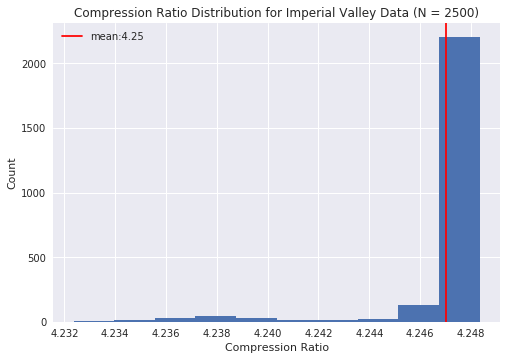

In [45]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(df_imperial['cmp_ratio'])
plt.axvline(x=np.mean(df_imperial['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df_imperial['cmp_ratio']), 2)))
ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Count')
plt.title('Compression Ratio Distribution for Imperial Valley Data (N = 2500)')
plt.style.use('seaborn')
plt.legend()
plt.show()

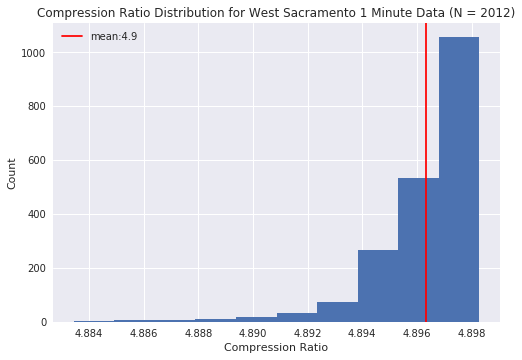

In [47]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(df_westsac['cmp_ratio'])
plt.axvline(x=np.mean(df_westsac['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df_westsac['cmp_ratio']), 2)))
ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Count')
plt.title('Compression Ratio Distribution for West Sacramento 1 Minute Data (N = 2012)')
plt.style.use('seaborn')
plt.legend()
plt.show()

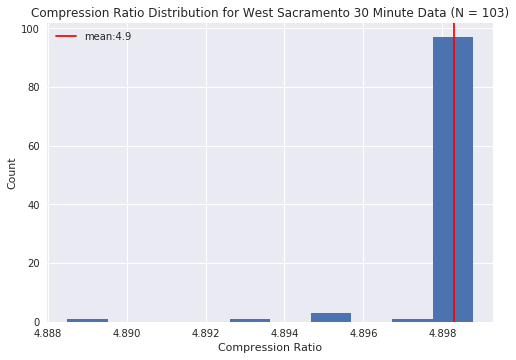

In [48]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.hist(df_30min['cmp_ratio'])
plt.axvline(x=np.mean(df_30min['cmp_ratio']), color='red', label='mean:'+str(np.round(np.mean(df_30min['cmp_ratio']), 2)))
ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Count')
plt.title('Compression Ratio Distribution for West Sacramento 30 Minute Data (N = 103)')
plt.style.use('seaborn')
plt.legend()
plt.show()

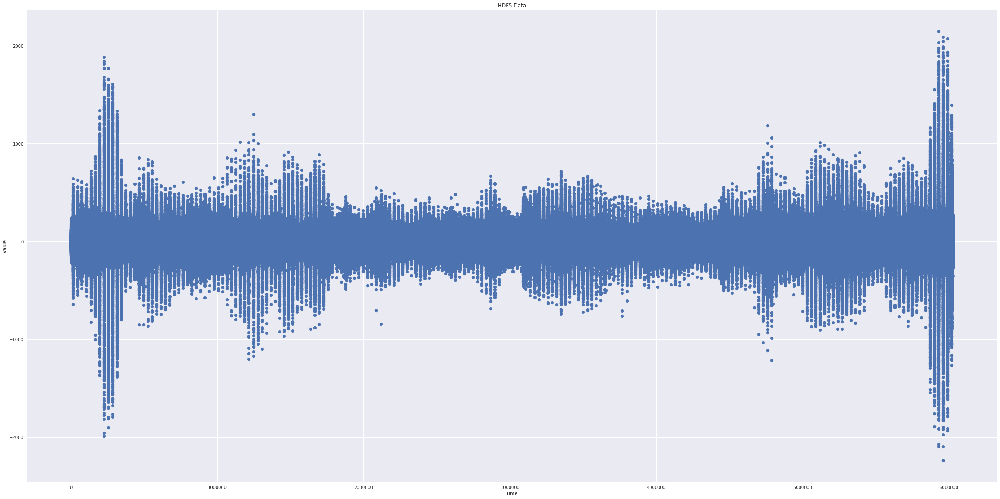

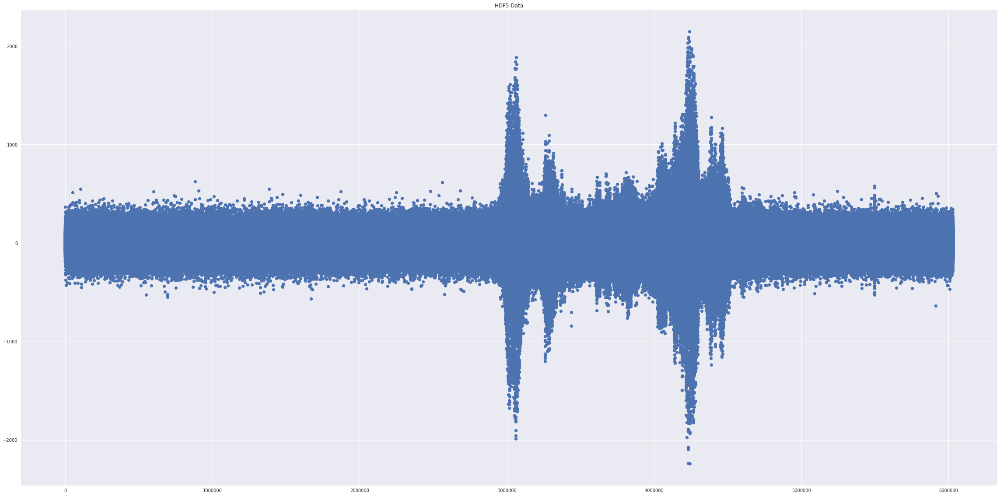

In [13]:
fig = plt.figure()
ax = fig.add_subplot(111)

with h5.File("../data/input/westSac_180103000031_ch4650_4850.h5", "r") as data:
    data1 = data["/DataCT"][:,:].flatten()
    data2 = np.transpose(data["/DataCT"][:,:]).flatten()

plt.scatter(x=np.arange(len(data1)), y=data1)

ax.set_xlabel('Time')
ax.set_ylabel('Value')
plt.title('HDF5 Data')
plt.style.use('seaborn')
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 40
fig_size[1] = 20
plt.rcParams["figure.figsize"] = fig_size
plt.show()

plt.scatter(x=np.arange(len(data2)), y=data2)

ax.set_xlabel('Time')
ax.set_ylabel('Value')
plt.title('HDF5 Data')
plt.style.use('seaborn')
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 40
fig_size[1] = 20
plt.rcParams["figure.figsize"] = fig_size
plt.show()

In [6]:
def diff_values(arr, deg=1):
    diff_arr = arr
    for i in range(deg):
        for i in range(len(arr) - 1):
            diff_arr[i + 1] = diff_arr[i]
            
def plot_values(directory, diff=0, transpose=False, sample=5):
    dir_ = os.listdir(directory)
    random.shuffle(dir_)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    count = 0
    for file in dir_:
        with h5.File(directory + file, "r") as data:
            if (not transpose):
                data = data["/DataCT"][:,:].flatten()
            else:
                data = np.transpose(data["/DataCT"][:,:]).flatten()

        plt.scatter(x=np.arange(len(data)), y=data)
        if (count == sample):
            break
        count += 1
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')
    plt.title('HDF5 Data')
    plt.style.use('seaborn')
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 40
    fig_size[1] = 20
    plt.rcParams["figure.figsize"] = fig_size
    plt.show()
def value_hist(dir_list, titles, sample=5):
    f, axarr = plt.subplots(1, 5, figsize=(20, 5))
    plt.subplots_adjust(wspace=0.5)
    f.suptitle('Value Histograms', fontsize=16)
    idx = 0
    for directory, title in zip(dir_list, titles):
        #i = int(idx / 2)
        #j = idx % 2
        dir_ = os.listdir(directory)
        random.shuffle(dir_)
        vals = np.array([])
        count = 0
        for file in dir_:
            if (count == sample):
                break
            elif (title == "West Sac 30 Min (N = 2)"):
                if (count == 2):
                    break
            with h5.File(directory + file, "r") as data:
                if directory == "../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/":
                    data = data["/Acoustic"][:,:].flatten()
                else:
                    data = data["/DataCT"][:,:].flatten()
            count += 1
            vals = np.append(vals, data).flatten()
        axarr[idx].hist(vals, bins=np.linspace(-5000, 5000, 100))
        axarr[idx].set_xlabel('Value')
        axarr[idx].set_ylabel('Count')
        axarr[idx].set_xlim(-5000, 5000)
        axarr[idx].set_title(title, pad=10)
        idx += 1
        
def test(dir_list, titles, sample=0.001):
    f, axarr = plt.subplots(1, 5, figsize=(20, 5))
    plt.subplots_adjust(wspace=0.5)
    f.suptitle('Value Histograms', fontsize=16)
    idx = 0
    for directory, title in zip(dir_list, titles):
        print("Collecting random sample of values from ", directory)
        dir_ = os.listdir(directory)
        random.shuffle(dir_)
        vals = np.array([])
        for file in dir_:
            with h5.File(directory + file, "r") as data:
                if directory == "../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/":
                    size = len(data["/Acoustic"][:,0])
                    indices = sorted(random.sample(range(size), int(size*sample)))
                    data = data["/Acoustic"][indices,:].flatten()
                else:
                    size = len(data["/DataCT"][:,0])
                    indices = sorted(random.sample(range(size), int(size*sample)))
                    data = data["/DataCT"][indices,:].flatten()
            vals = np.append(vals, data).flatten()
        axarr[idx].hist(vals, bins=np.linspace(-10000, 10000, 100))
        axarr[idx].set_xlabel('Value')
        axarr[idx].set_ylabel('Count')
        axarr[idx].set_xlim(-10000, 10000)
        axarr[idx].set_title(title)
        idx += 1

Text(0.5, 1.0, 'Value Distribution for Sample Data')

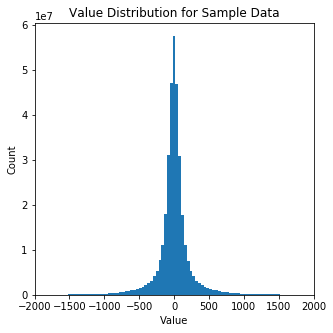

In [8]:
f, axarr = plt.subplots(figsize=(5, 5))
vals = np.array([])
with h5.File("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/input/westSac_180103000031.tdms.h5", "r") as data:
    data = data["/DataCT"][:,:].flatten()
vals = np.append(vals, data).flatten()
axarr.hist(vals, bins=np.linspace(-2000, 2000, 100))
axarr.set_xlabel('Value')
axarr.set_ylabel('Count')
axarr.set_xlim(-2000, 2000)
axarr.set_title("Value Distribution for Sample Data")

Text(0.5, 1.0, 'Value Distribution for Sample Data')

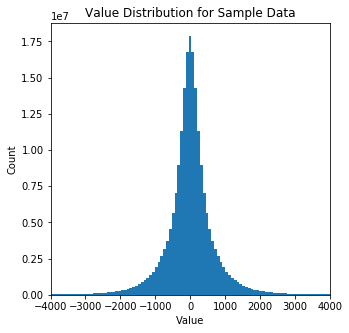

In [11]:
f, axarr = plt.subplots(figsize=(5, 5))
vals = np.array([])
with h5.File("../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/DF__UTC_20201110_231858.642.h5", "r") as data:
    data = data["/Acoustic"][:,:].flatten()
vals = np.append(vals, data).flatten()
axarr.hist(vals, bins=np.linspace(-4000, 4000, 100))
axarr.set_xlabel('Value')
axarr.set_ylabel('Count')
axarr.set_xlim(-4000, 4000)
axarr.set_title("Value Distribution for Sample Data")

In [ ]:
directories = [ "../../../../../../project/projectdirs/m1248/Bin_compression_data/Fairbanks_aug16_h5/", 
               "../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/", 
               "../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/input/",
               "../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/30min/", 
               "../../../../../../project/projectdirs/m1248/Bin_compression_data/MBARI_2019_h5/"]
titles = ["Fairbanks (N = 997)",  "Imperial Valley (N = 2500)", "West Sac 1 Min (N = 2012)", "West Sac 30 Min (N = 103)", "MBARI (N = 2859)"]
test(directories, titles)

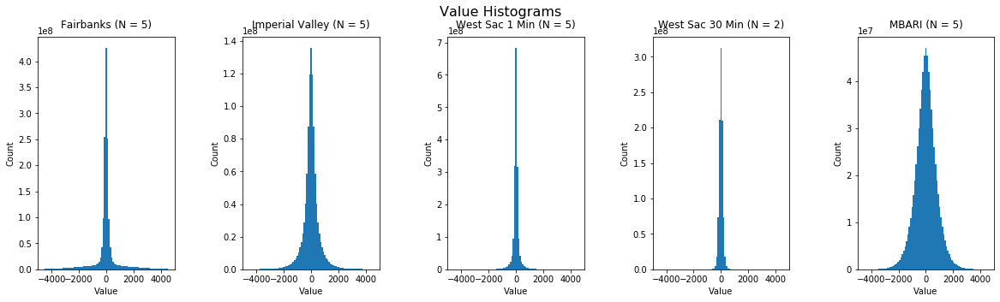

In [7]:
directories = [ "../../../../../../project/projectdirs/m1248/Bin_compression_data/Fairbanks_aug16_h5/", 
               "../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/", 
               "../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/input/",
               "../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/30min/", 
               "../../../../../../project/projectdirs/m1248/Bin_compression_data/MBARI_2019_h5/"]
titles = ["Fairbanks (N = 5)", "Imperial Valley (N = 5)", "West Sac 1 Min (N = 5)", "West Sac 30 Min (N = 2)", "MBARI (N = 5)"]
value_hist(directories, titles, sample=5)

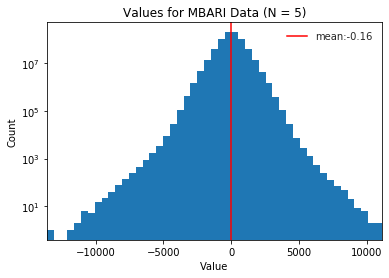

In [6]:
value_hist("../../../../../../project/projectdirs/m1248/Bin_compression_data/MBARI_2019_h5/", sample=5, title='Values for MBARI Data (N = 5)')

In [ ]:
value_hist("../../../../../../project/projectdirs/m1248/Bin_compression_data/Fairbanks_aug16_h5/", sample=5, title='Values for Fairbanks Data (N = 5)')

In [ ]:
value_hist("../../../../../../project/projectdirs/m1248/DAS-DATA/DarkFiber_ambientTest_201110/", sample=5, title='Values for Imperial Valley Data (N = 5)')

In [ ]:
value_hist("../../../../../../project/projectdirs/m1248/alex/media/sf_das_compression/data/input/", sample=5, title='Values for West Sacramento Data (N = 5)')

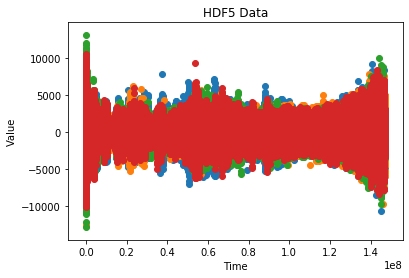

In [6]:
plot_values("../../../../../../project/projectdirs/m1248/Bin_compression_data/MBARI_2019_h5/", sample=3)

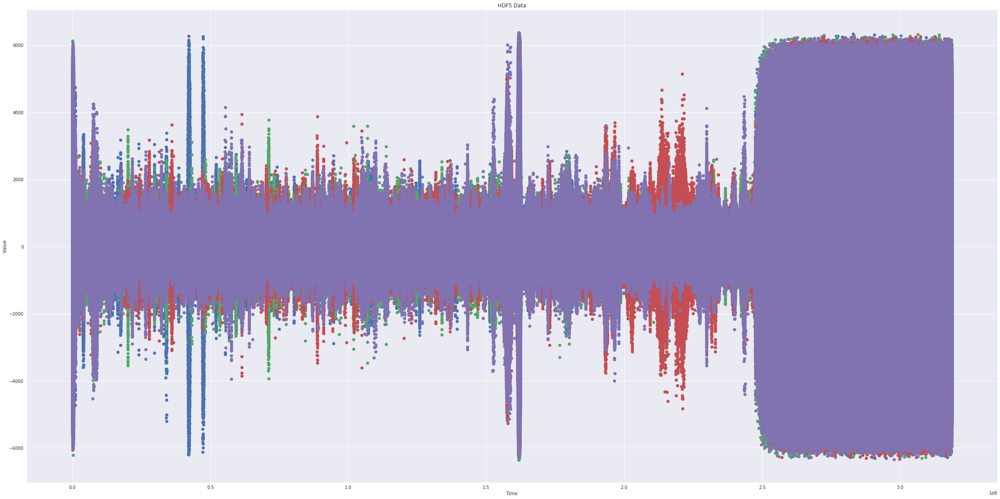

In [7]:
plot_values("../../../../../../project/projectdirs/m1248/Bin_compression_data/Fairbanks_aug16_h5/", sample=3)

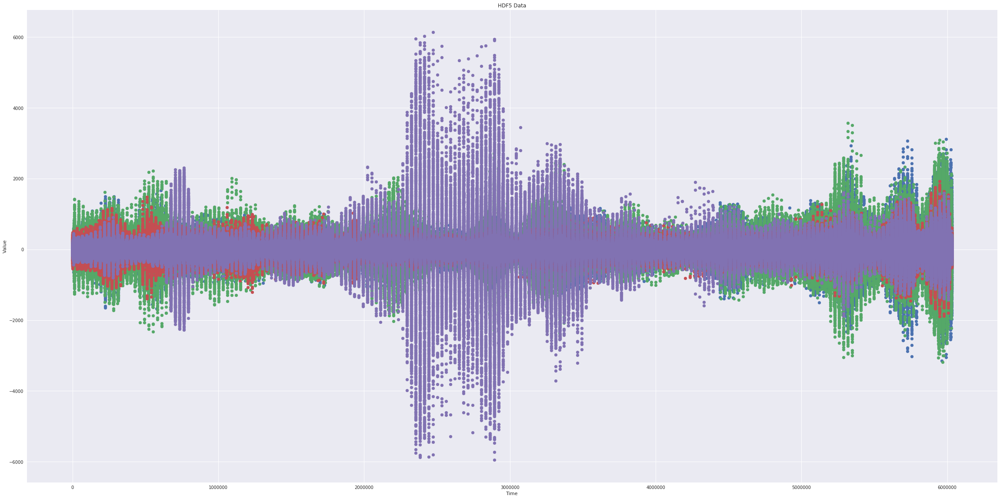

In [8]:
plot_values("../data/input/", sample=3)

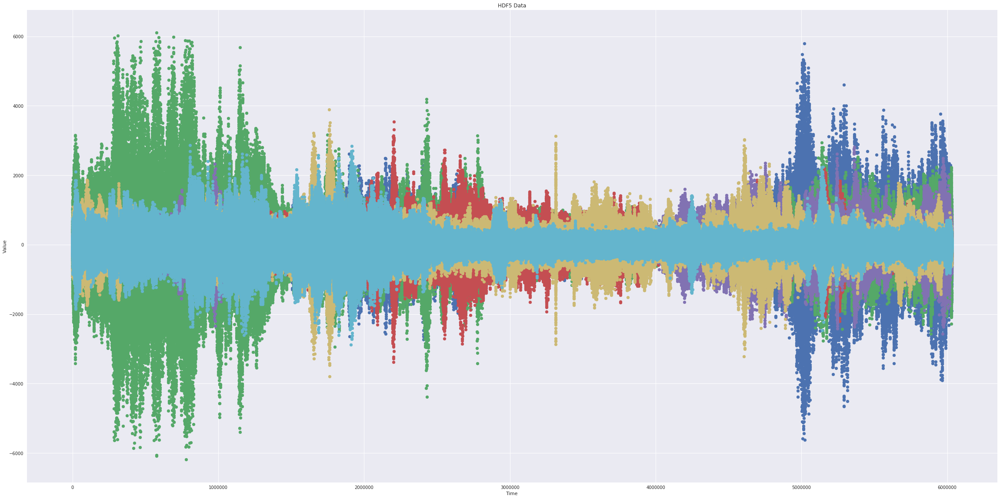

In [27]:
plot_values("../data/input/", transpose=True)

# SZ Analysis

In [2]:
data_sz = pd.read_csv("../logs/output_log_sz.csv")
data_zfp = pd.read_csv("../logs/output_log_zfp.csv")
data_fastpfor = pd.read_csv("../logs/output_log_fastpfor.csv")
data_zfp = data_zfp.drop(labels=[0])
#data_sz_xcorr = pd.read_csv("../logs/output_log_xcorr_sz.csv")
data_sz['rmse_norm'] = data_sz['rmse'] / data_sz['abs_mean_uncmp']
data_zfp['rmse'] = data_zfp['rmse'].astype(float)
data_zfp['abs_mean_uncmp'] = data_zfp['abs_mean_uncmp'].astype(float)
data_zfp['cmp_ratio'] = data_zfp['cmp_ratio'].astype(float)
data_zfp['rate'] = data_zfp['rate'].astype(int)
data_zfp['cmp_time'] = data_zfp['cmp_time'].astype(int)
data_zfp['decmp_time'] = data_zfp['decmp_time'].astype(int)
data_zfp['rate'] = data_zfp['rate'].astype(int)
data_zfp['rmse_norm'] = data_zfp['rmse'] / data_zfp['abs_mean_uncmp']
data_fastpfor['rmse_norm'] = data_fastpfor['rmse'] / data_fastpfor['abs_mean_uncmp']
#data_sz_xcorr.dropna()
#data_sz_xcorr['rmse_norm'] = data_sz_xcorr['rmse'] / data_sz_xcorr['abs_mean_uncmp']
data_sz['file_name'] = data_sz['file_name'].str.slice(0, 20)
data_zfp['file_name'] = data_zfp['file_name'].str.slice(0, 20)
data_fastpfor['file_name'] = data_fastpfor['file_name'].str.slice(0, 20)
#data_sz_xcorr['file_name'] = data_sz_xcorr['file_name'].str.slice(0, 20)
#data_sz_merged = data_sz_xcorr.merge(data_sz[['file_name', 'err_bound', 'best_cmp', 'cmp_ratio']], how='left', 
                          #left_on=['file_name', 'err_bnd', 'best_cmp'], 
                          #right_on=['file_name', 'err_bound', 'best_cmp'])

In [36]:
np.mean(data_sz[data_sz['err_bound'] == 0.003]['rmse_norm']), np.mean(data_sz[data_sz['err_bound'] == 0.003]['cmp_ratio']), np.mean(data_sz[data_sz['err_bound'] == 0.003]['cmp_time']), np.mean(data_sz[data_sz['err_bound'] == 0.003]['decmp_time'])

(0.12782205106096647, 3.725542166666665, 474.3833333333333, 207.28333333333333)

In [38]:
np.mean(data_zfp[data_zfp['rate'] == 8]['rmse_norm']), np.mean(data_zfp[data_zfp['rate'] == 8]['cmp_ratio']), np.mean(data_zfp[data_zfp['rate'] == 8]['cmp_time']), np.mean(data_zfp[data_zfp['rate'] == 8]['decmp_time'])

(0.04339742051517233, 1.9705899999999947, 394.4, 225.05)

In [17]:
np.mean(data_fastpfor['rmse_norm']), np.mean(data_fastpfor['cmp_ratio']), np.mean(data_fastpfor['cmp_time']), np.mean(data_fastpfor['decmp_time'])

(0.0, 5.302552750000003, 86.1, 975.2333333333333)

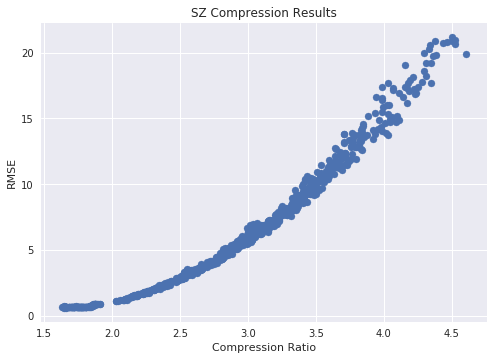

<Figure size 1152x648 with 0 Axes>

In [62]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse', data=data_sz)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE')
plt.title('SZ Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

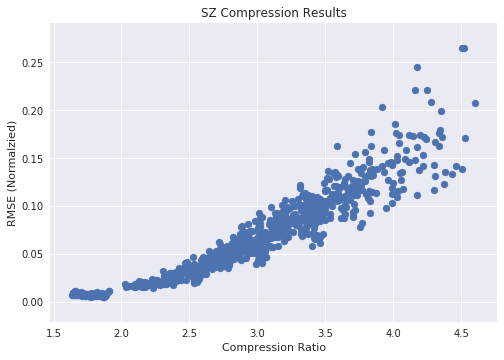

<Figure size 1152x648 with 0 Axes>

In [63]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse_norm', data=data_sz)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE (Normalzied)')
plt.title('SZ Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

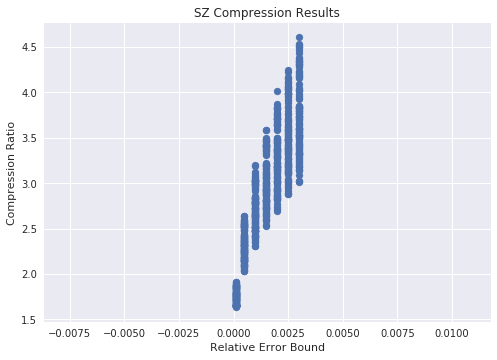

<Figure size 1152x648 with 0 Axes>

In [64]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='err_bound', y='cmp_ratio', data=data_sz)

ax.set_xlabel('Relative Error Bound')
ax.set_ylabel('Compression Ratio')
plt.title('SZ Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

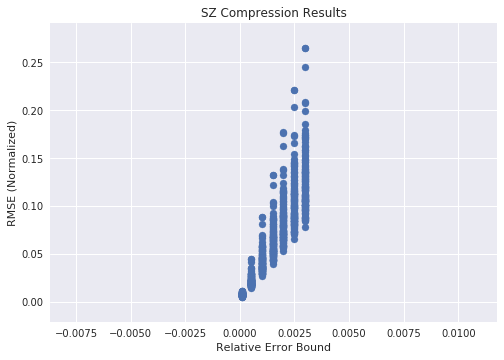

<Figure size 1152x648 with 0 Axes>

In [65]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='err_bound', y='rmse_norm', data=data_sz)

ax.set_xlabel('Relative Error Bound')
ax.set_ylabel('RMSE (Normalized)')
plt.title('SZ Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

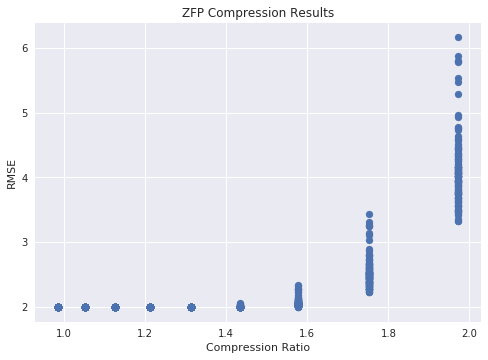

<Figure size 1152x648 with 0 Axes>

In [69]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse', data=data_zfp)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE')
plt.title('ZFP Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

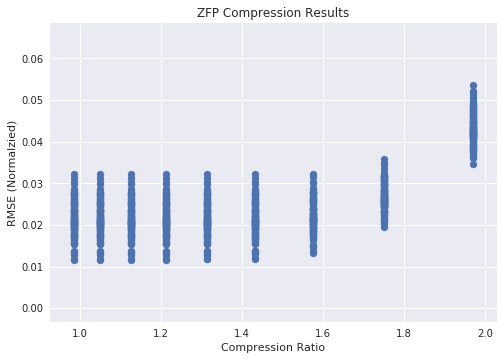

<Figure size 1152x648 with 0 Axes>

In [71]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse_norm', data=data_zfp)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE (Normalzied)')
plt.title('ZFP Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

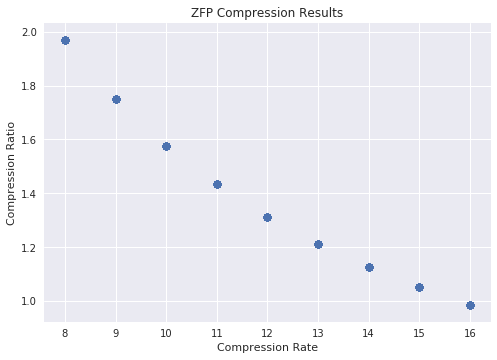

<Figure size 1152x648 with 0 Axes>

In [74]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='rate', y='cmp_ratio', data=data_zfp)

ax.set_xlabel('Compression Rate')
ax.set_ylabel('Compression Ratio')
plt.title('ZFP Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

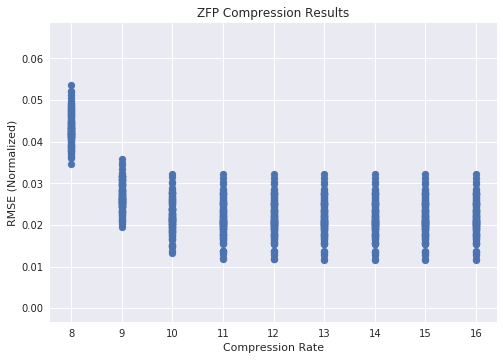

<Figure size 1152x648 with 0 Axes>

In [75]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='rate', y='rmse_norm', data=data_zfp)

ax.set_xlabel('Compression Rate')
ax.set_ylabel('RMSE (Normalized)')
plt.title('ZFP Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

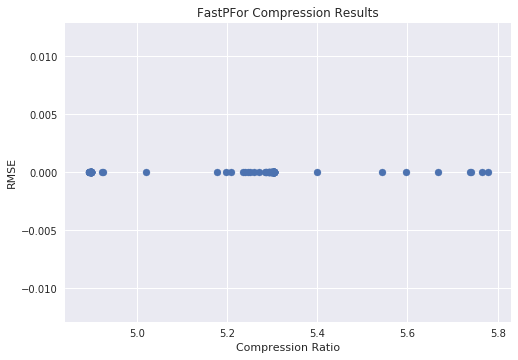

<Figure size 1152x648 with 0 Axes>

In [86]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse', data=data_fastpfor)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE')
plt.title('FastPFor Compression Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse', data=data_sz_merged)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE')
plt.title('SZ Compression Xcorrelation Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='cmp_ratio', y='rmse_norm', data=data_sz_merged)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('RMSE (Normalized)')
plt.title('SZ Compression Xcorrelation Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='err_bnd', y='cmp_ratio', data=data_sz_merged)

ax.set_xlabel('Relative Error Bound')
ax.set_ylabel('Compression Ratio')
plt.title('SZ Compression Xcorrelation Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x='err_bnd', y='rmse_norm', data=data_sz_merged)

ax.set_xlabel('Relative Error Bound')
ax.set_ylabel('RMSE (Normalized)')
plt.title('SZ Compression Xcorrelation Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

## Xcorrelation Analysis

In [ ]:
def plot_xcorr(xcorr_dir):
    xcorr_dir_sorted = os.listdir(xcorr_dir)
    xcorr_dir_sorted.sort()
    for filename_uncomp in xcorr_dir_sorted:
        if (filename_uncomp == ".tdms_xcorr.h5"):
            continue
        if (re.match("(.*)(decompressed)(.*)", filename_uncomp) == None):
            for filename_decomp in xcorr_dir_sorted:
                filename_uncomp_base = re.sub(".tdms_xcorr.h5", "", filename_uncomp)
                if (re.match(filename_uncomp_base, filename_decomp) != None and 
                    re.match("(.*)(decompressed)(.*)", filename_decomp) != None):
                    
                    with h5.File(xcorr_dir + filename_decomp, "r") as xcorr_decomp:
                        data_decomp = xcorr_decomp["/Xcorr/Xcorr"][:,:]
                    with h5.File(xcorr_dir + filename_uncomp, "r") as xcorr_uncomp:
                        data_uncomp = xcorr_uncomp["/Xcorr/Xcorr"][:,:]
                        
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title("Xcorrelation for " + filename_uncomp)
                    plt.show()
                    
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(data_decomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title("Xcorrelation for " + filename_decomp)
                    plt.show()
                    
                    data_diff = abs(data_uncomp - data_decomp) / abs(data_uncomp)
                    
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(data_diff, aspect='auto', cmap='jet', vmax=1)
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title(filename_uncomp + " - " + filename_decomp)
                    plt.show()

### Plotting Xcorrelation Results

In [ ]:
plot_xcorr("../data/output/xcorr/")

In [ ]:
def plot_xcorr_log(xcorr_dir):
    xcorr_dir_sorted = os.listdir(xcorr_dir)
    xcorr_dir_sorted.sort()
    for filename_uncomp in xcorr_dir_sorted:
        if (filename_uncomp == ".tdms_xcorr.h5"):
            continue
        if (re.match("(.*)(decompressed)(.*)", filename_uncomp) == None):
            for filename_decomp in xcorr_dir_sorted:
                filename_uncomp_base = re.sub(".tdms_xcorr.h5", "", filename_uncomp)
                if (re.match(filename_uncomp_base, filename_decomp) != None and 
                    re.match("(.*)(decompressed)(.*)", filename_decomp) != None):
                    with h5.File(xcorr_dir + filename_decomp, "r") as xcorr_decomp:
                        data_decomp = xcorr_decomp["/Xcorr/Xcorr"][:,:]
                    
                    with h5.File(xcorr_dir + filename_uncomp, "r") as xcorr_uncomp:
                        data_uncomp = xcorr_uncomp["/Xcorr/Xcorr"][:,:]
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(abs(data_uncomp), aspect='auto', cmap='jet', norm=LogNorm())
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title("Xcorrelation for " + filename_uncomp)
                    plt.show()
                    
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(abs(data_decomp), aspect='auto', cmap='jet', norm=LogNorm())
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title("Xcorrelation for " + filename_decomp)
                    plt.show()
                    
                    data_diff = abs(data_uncomp - data_decomp) / abs(data_uncomp)
                    
                    plt.style.use('seaborn')
                    plt.subplots(figsize=(10,6))
                    plt.imshow(data_diff, aspect='auto', cmap='jet', norm=LogNorm(), vmax=1)
                    plt.colorbar(pad=0.02)
                    plt.tight_layout()
                    plt.title(filename_uncomp + " - " + filename_decomp)
                    plt.show()

### Plotting Xcorrelation Results with Log Norm

In [ ]:
plot_xcorr_log("../data/output/xcorr/")

In [ ]:
with h5.File("../data/xcorr_stack_output_ch4650_4850/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_uncomp:
    data_uncomp = np.transpose(xcorr_uncomp["/data"][:,np.arange(7200, 7800)])
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()

## Stacking Analysis

In [33]:
dir_sorted = os.listdir("../data/")
dir_sorted.sort()
for d in dir_sorted:
    if (re.match("^xcorr_stack_output.*", d) and re.match(".*_0_.*", d)):
        print(d)
for d in dir_sorted:
    if (re.match("^xcorr_stack_output.*", d) and re.match(".*_[0-9]{2}$", d)):
        print(d)

xcorr_stack_output_ch4650_4850_0_0001
xcorr_stack_output_ch4650_4850_0_0005
xcorr_stack_output_ch4650_4850_0_001
xcorr_stack_output_ch4650_4850_0_0015
xcorr_stack_output_ch4650_4850_0_002
xcorr_stack_output_ch4650_4850_0_0025
xcorr_stack_output_ch4650_4850_0_003
xcorr_stack_output_ch4650_4850_08
xcorr_stack_output_ch4650_4850_09
xcorr_stack_output_ch4650_4850_10
xcorr_stack_output_ch4650_4850_11
xcorr_stack_output_ch4650_4850_12
xcorr_stack_output_ch4650_4850_13
xcorr_stack_output_ch4650_4850_14
xcorr_stack_output_ch4650_4850_15
xcorr_stack_output_ch4650_4850_16


In [41]:
def generate_stacking_results(directory):
    dir_sorted = os.listdir(directory)
    dir_sorted.sort()
    err_list = ['0.0001', '0.0005', '0.001', '0.0015', '0.002', '0.0025', '0.003']
    err_idx = 0
    stack_rel_rmse = []
    for d in dir_sorted:
        if (re.match("^xcorr_stack_output.*", d) and re.match(".*_0_.*", d)):
            curr_dir = "../data/" + d
            curr_file = curr_dir + "/xcorr_examples_h5_stack_final_pwstack.h5"
            with h5.File("../data/xcorr_stack_output_ch4650_4850/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_uncomp:
                data_uncomp = np.transpose(xcorr_uncomp["/data"][:,np.arange(7250, 7750)])
                        
            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking (uncomp)")
            plt.show()

            with h5.File(curr_file, "r") as xcorr_decomp:
                data_decomp = np.transpose(xcorr_decomp["/data"][:,np.arange(7250, 7750)])
                        
            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(data_decomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking (Decompressed " + err_list[err_idx] + ")")
            plt.show()

            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(abs(data_decomp - data_uncomp), aspect='auto', cmap='jet')
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking Difference")
            plt.show()

            rmse = np.mean((data_decomp - data_uncomp)**2)**0.5
            abs_mean = np.mean(np.abs(data_uncomp))
            print('RMSE: ', rmse)
            print('Relative RMSE: ', rmse / abs_mean)
            stack_rel_rmse.append(rmse / abs_mean)
            err_idx += 1
            
    avg_cmp = data_sz.groupby('err_bound').mean()['cmp_ratio'].tolist()
    fig = plt.figure()
    ax = fig.add_subplot(111)

    plt.scatter(x=avg_cmp, y=stack_rel_rmse)

    ax.set_xlabel('Average Compression Ratio')
    ax.set_ylabel('Relative RMSE')
    plt.title('SZ Compression Stacking Results')
    plt.style.use('seaborn')
    plt.figure(figsize=(16,9))
    plt.show()
    
    rate_list = ['8', '9', '10', '11', '12', '13', '14', '15', '16']
    rate_idx = 0
    stack_rel_rmse = []
            
    for d in dir_sorted:
        if (re.match("^xcorr_stack_output.*", d) and re.match(".*_[0-9]{2}$", d)):
            curr_dir = "../data/" + d
            curr_file = curr_dir + "/xcorr_examples_h5_stack_final_pwstack.h5"
            with h5.File("../data/xcorr_stack_output_ch4650_4850/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_uncomp:
                data_uncomp = np.transpose(xcorr_uncomp["/data"][:,np.arange(7250, 7750)])
                        
            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking (uncomp)")
            plt.show()

            with h5.File(curr_file, "r") as xcorr_decomp:
                data_decomp = np.transpose(xcorr_decomp["/data"][:,np.arange(7250, 7750)])
                        
            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(data_decomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking (Decompressed " + rate_list[rate_idx] + ")")
            plt.show()

            plt.style.use('seaborn')
            plt.subplots(figsize=(10,7))
            plt.imshow(abs(data_decomp - data_uncomp), aspect='auto', cmap='jet')
            plt.colorbar(pad=0.02)
            plt.tight_layout()
            plt.title("Xcorrelation Stacking Difference")
            plt.show()

            rmse = np.mean((data_decomp - data_uncomp)**2)**0.5
            abs_mean = np.mean(np.abs(data_uncomp))
            print('RMSE: ', rmse)
            print('Relative RMSE: ', rmse / abs_mean)
            stack_rel_rmse.append(rmse / abs_mean)
            rate_idx += 1
    
    avg_cmp = data_zfp.groupby('rate').mean()['cmp_ratio'].tolist()
    fig = plt.figure()
    ax = fig.add_subplot(111)

    plt.scatter(x=avg_cmp, y=stack_rel_rmse)

    ax.set_xlabel('Average Compression Ratio')
    ax.set_ylabel('Relative RMSE')
    plt.title('ZFP Compression Stacking Results')
    plt.style.use('seaborn')
    plt.figure(figsize=(16,9))
    plt.show()

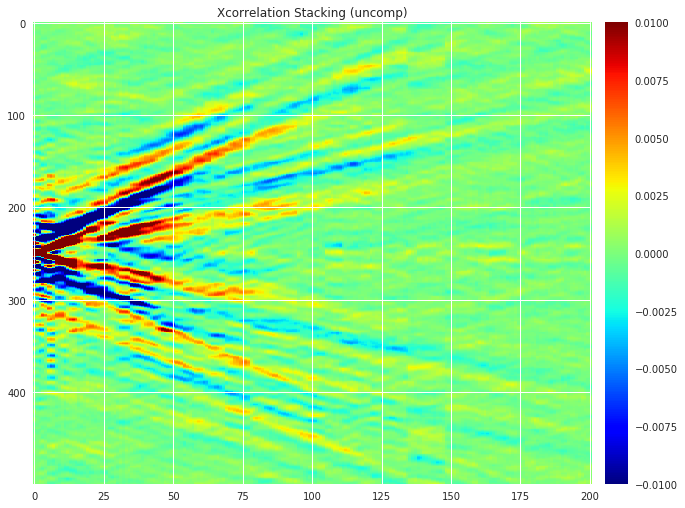

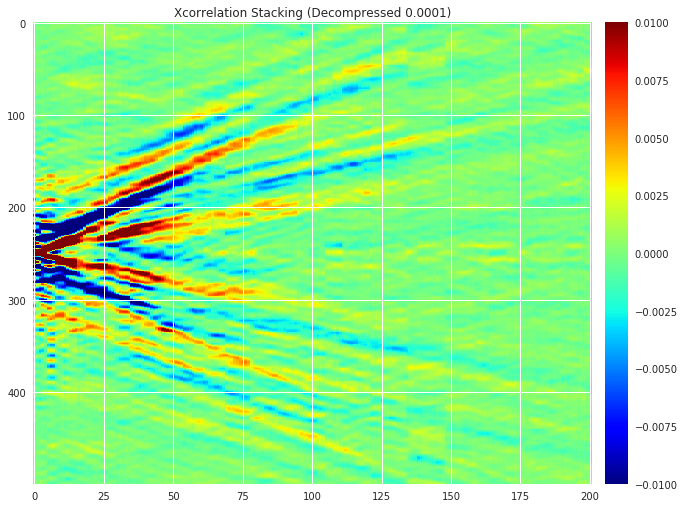

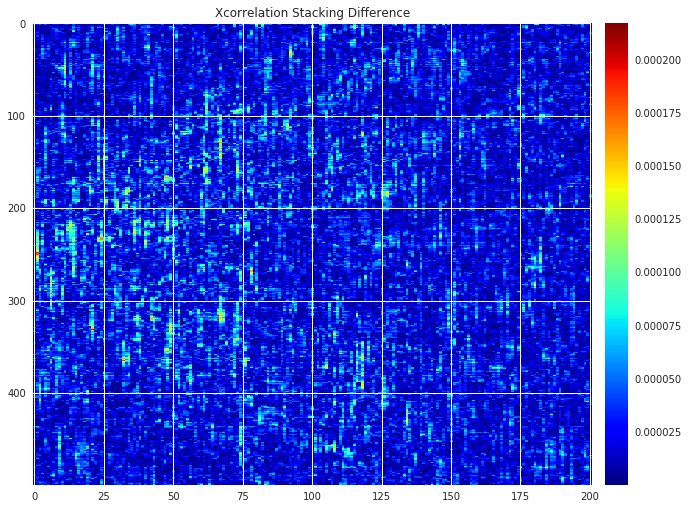

RMSE:  3.362586101096026e-05
Relative RMSE:  0.027209505353178856


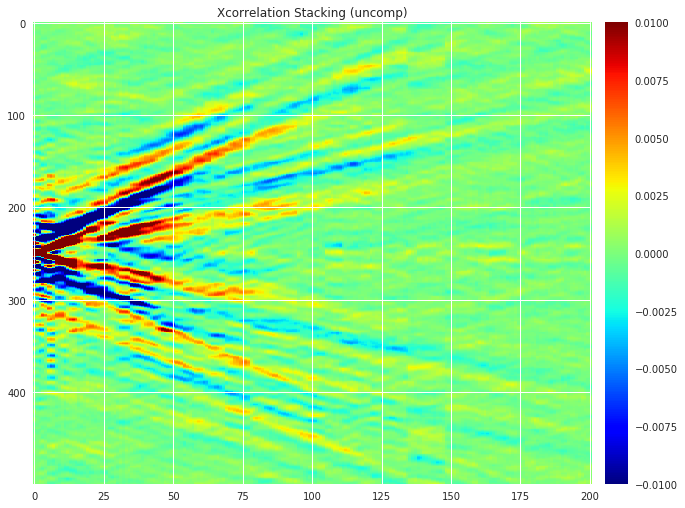

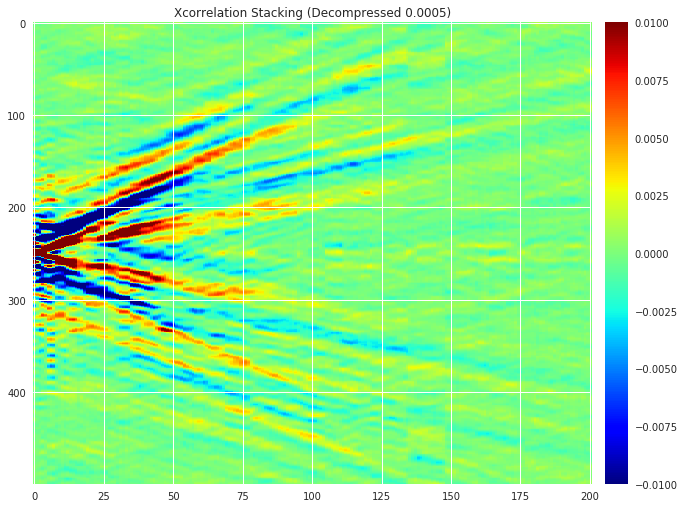

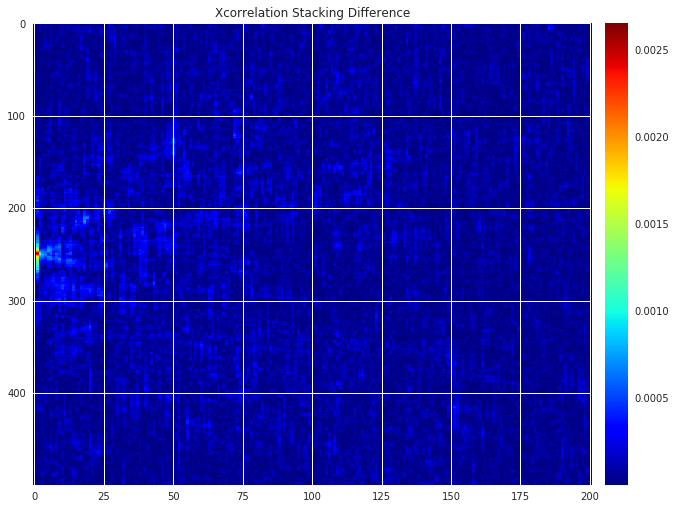

RMSE:  0.00010471165875051432
Relative RMSE:  0.08473098840156638


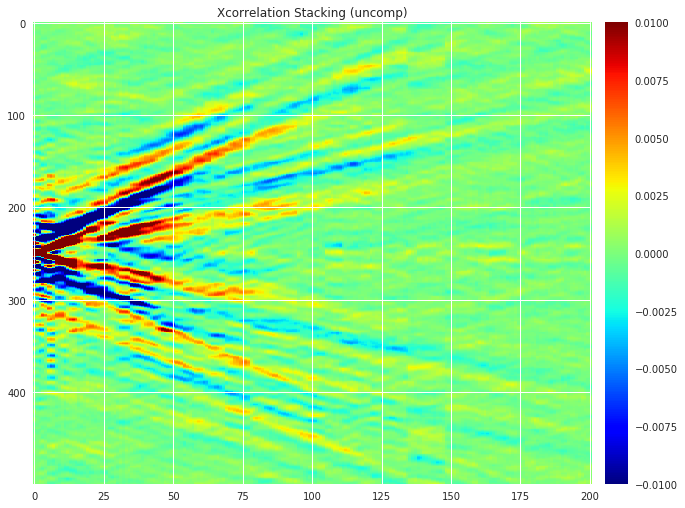

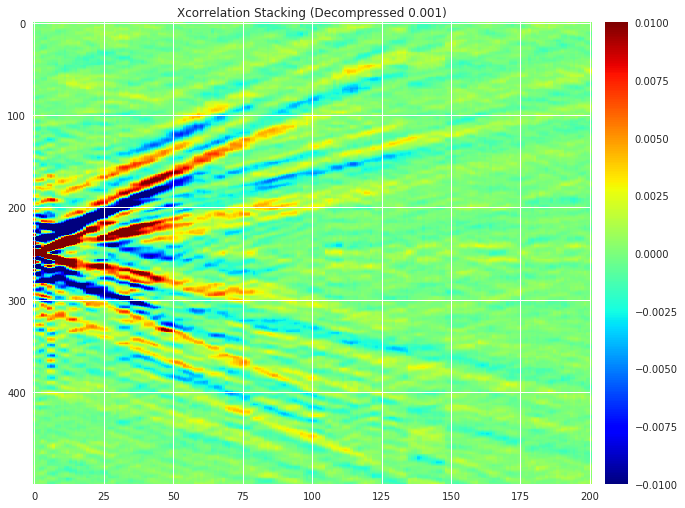

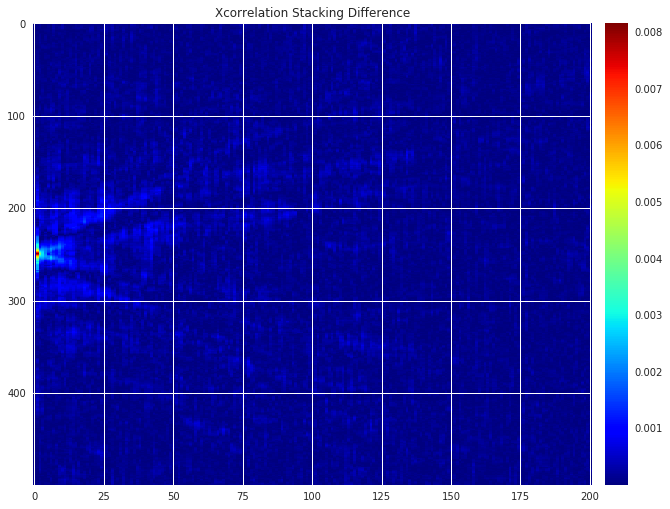

RMSE:  0.0002242316327804313
Relative RMSE:  0.1814446271131169


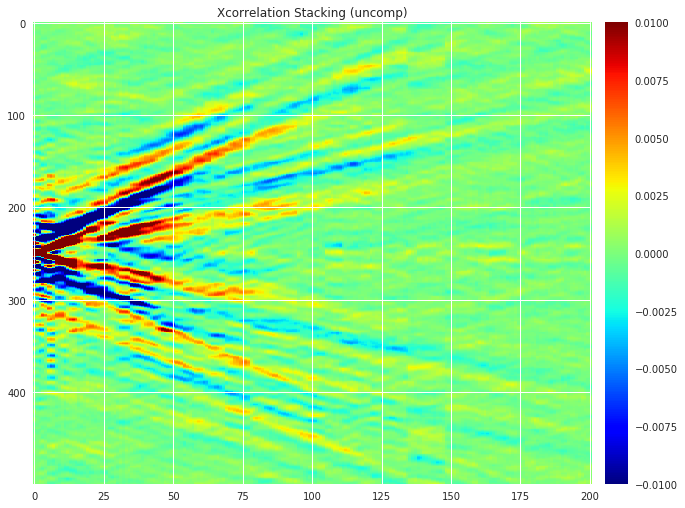

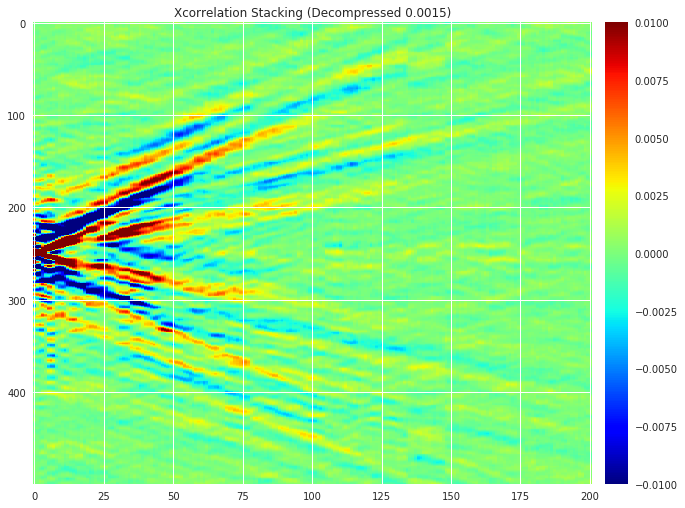

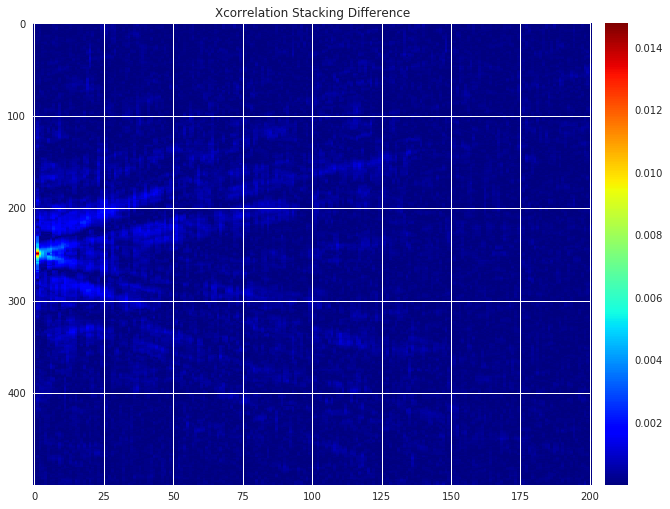

RMSE:  0.0003570339991476996
Relative RMSE:  0.288906163857327


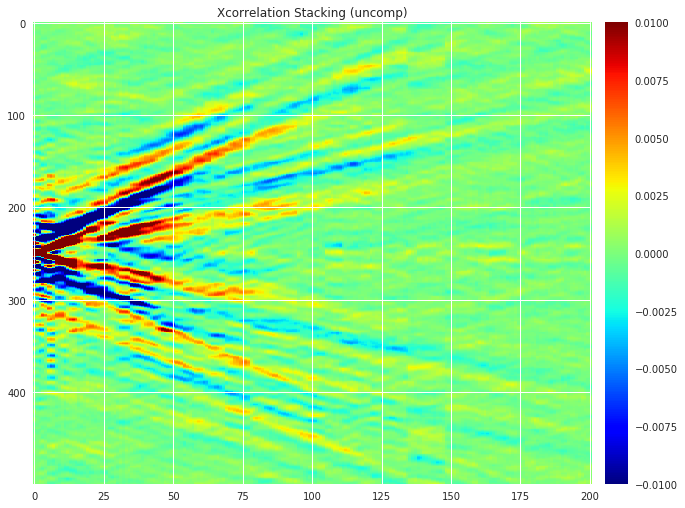

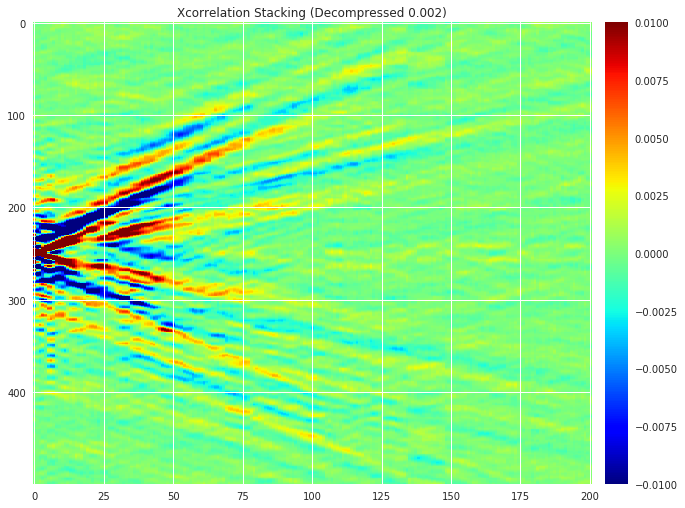

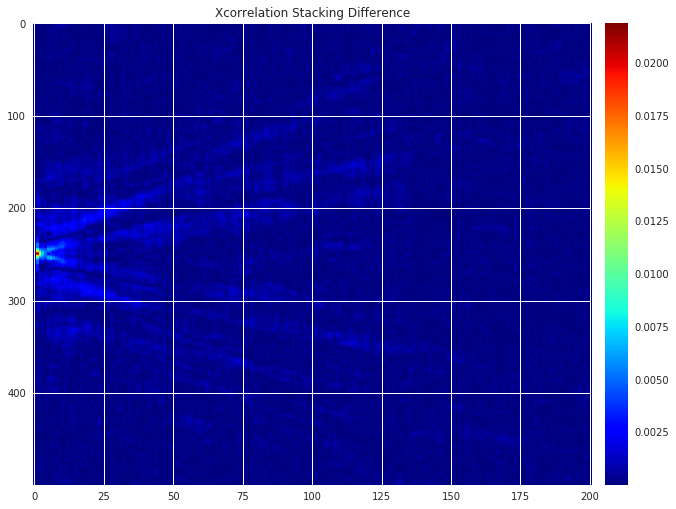

RMSE:  0.00047930380792403116
Relative RMSE:  0.38784492457329356


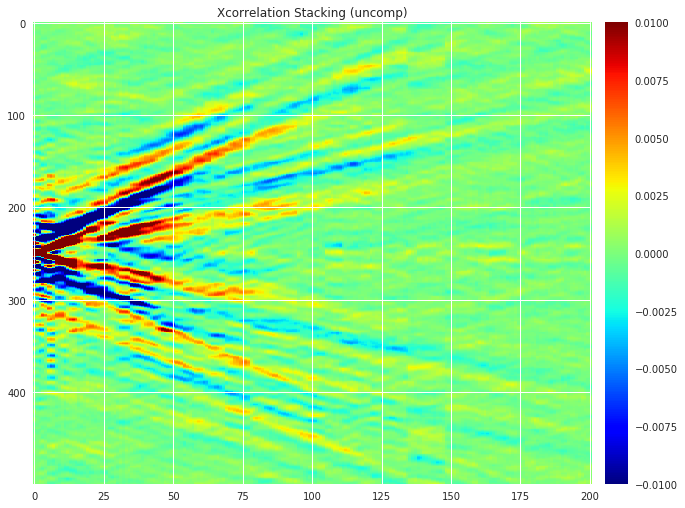

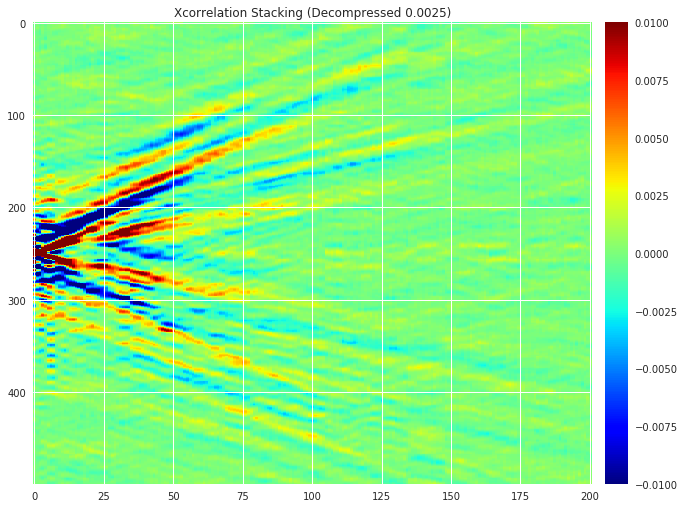

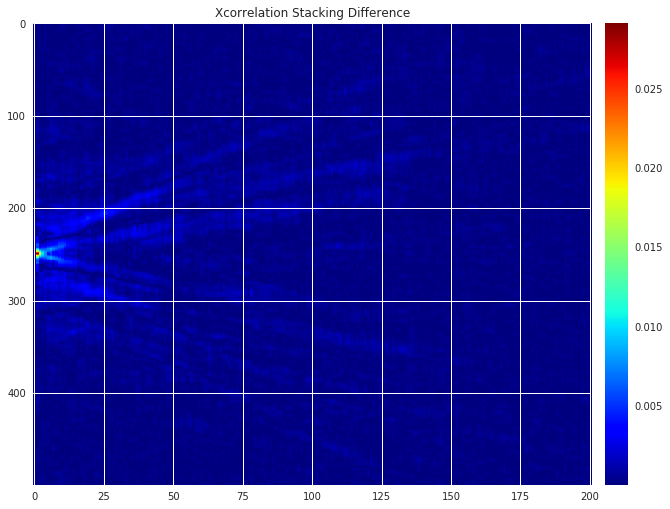

RMSE:  0.0006169807182545805
Relative RMSE:  0.49925086381235634


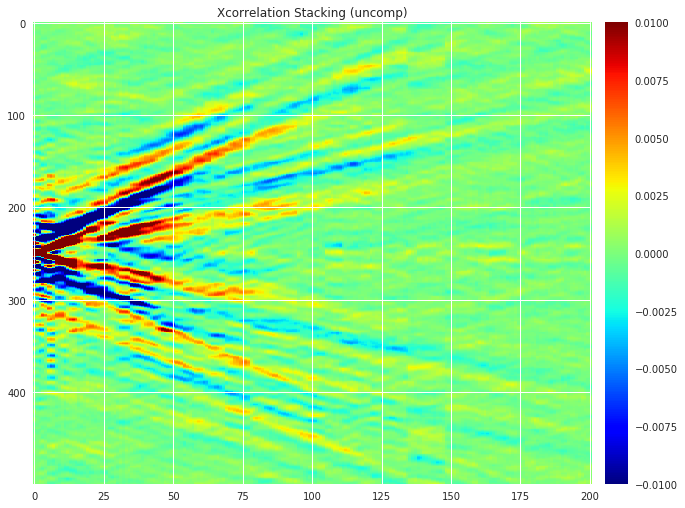

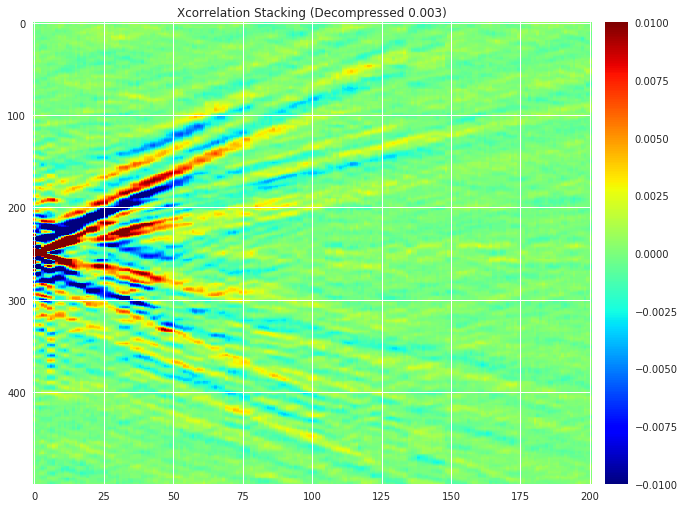

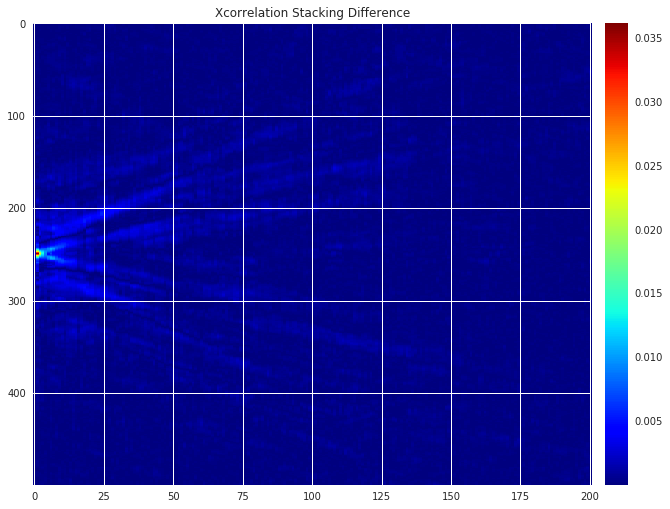

RMSE:  0.0007366019243944437
Relative RMSE:  0.5960464179174367


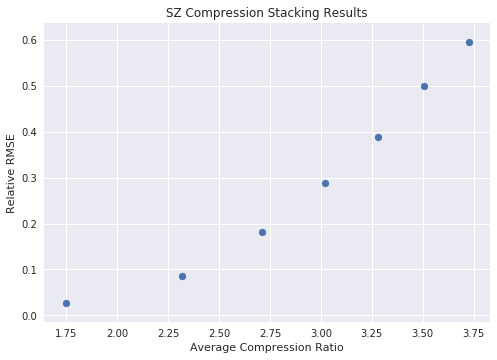

<Figure size 1152x648 with 0 Axes>

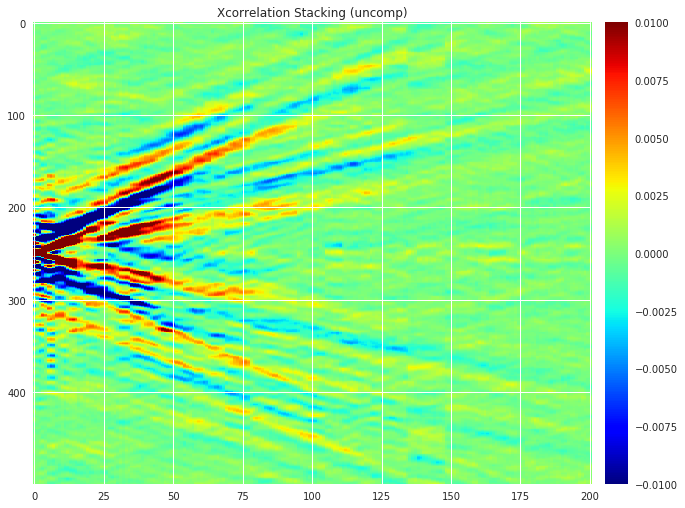

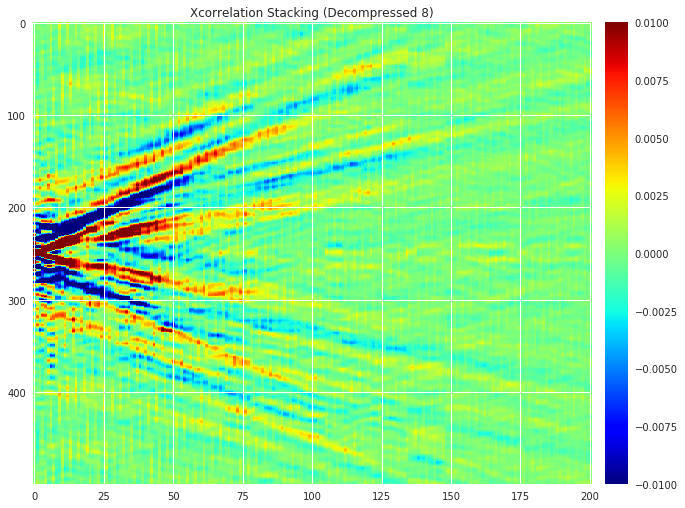

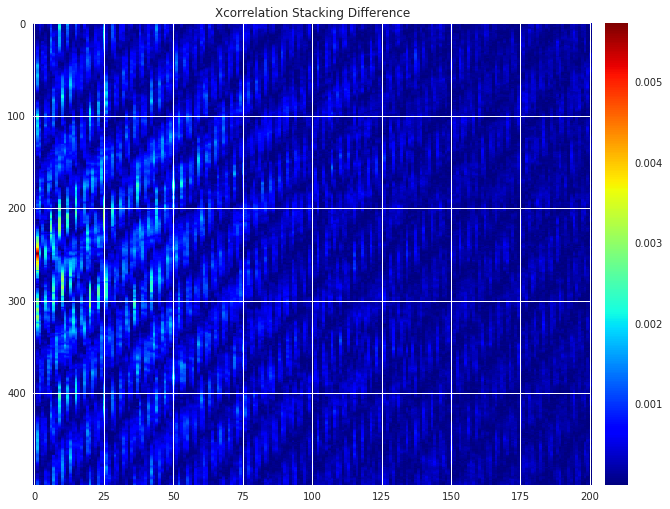

RMSE:  0.0004896098010274668
Relative RMSE:  0.39618436826594294


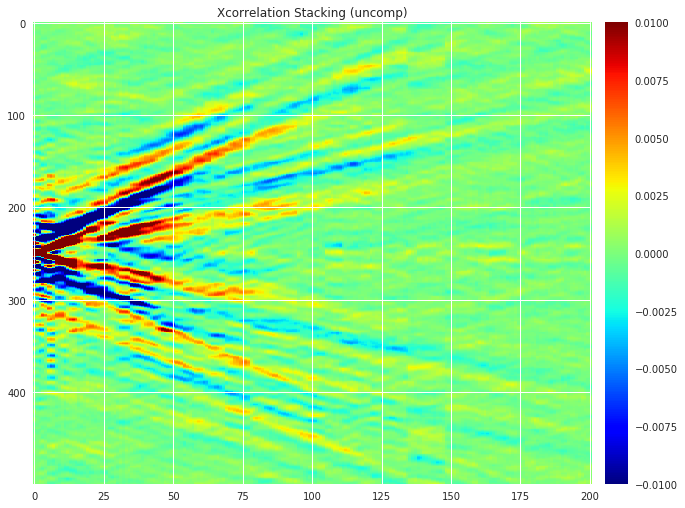

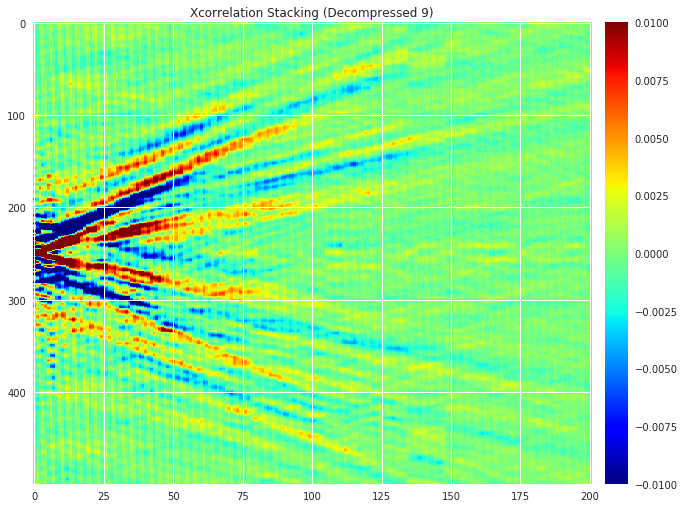

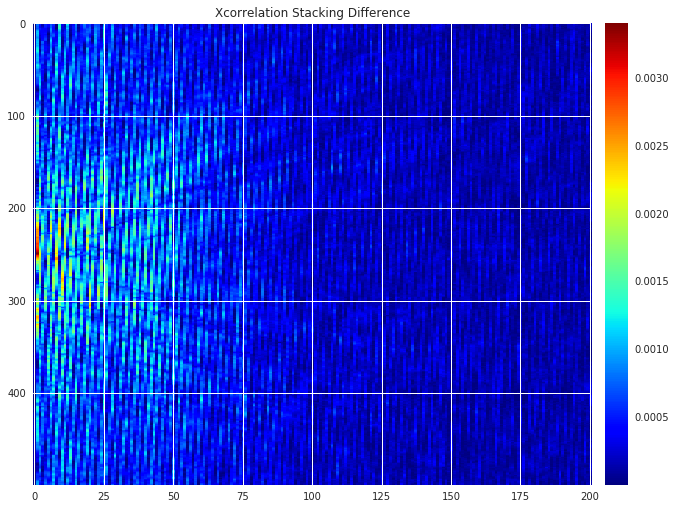

RMSE:  0.0004812203219471005
Relative RMSE:  0.38939573686485546


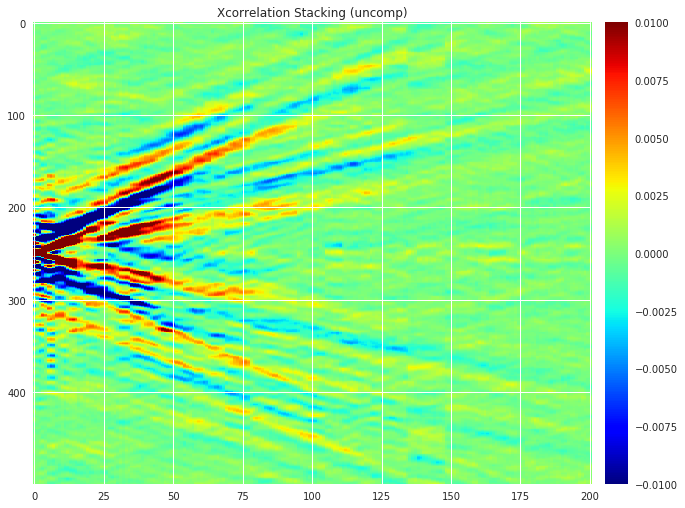

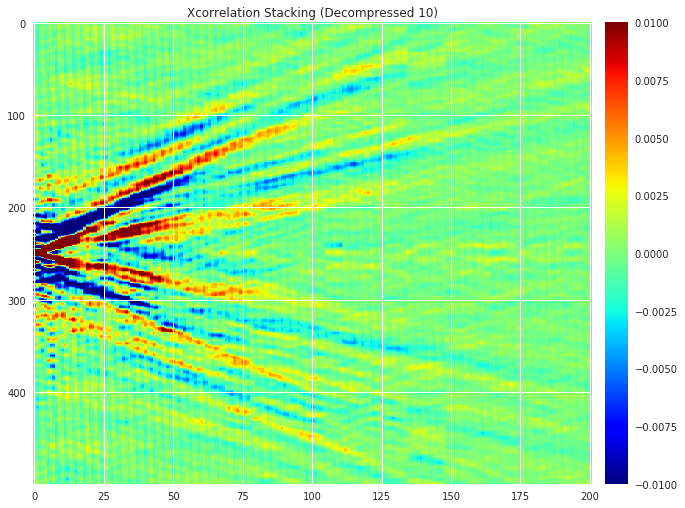

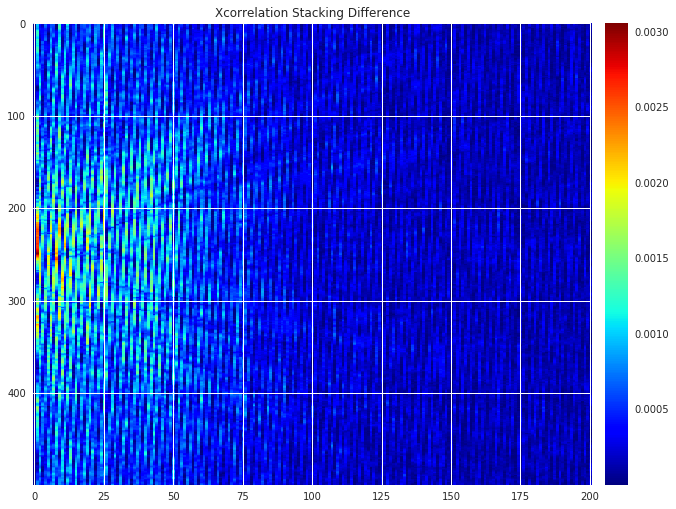

RMSE:  0.00047987805990459706
Relative RMSE:  0.3883096000305016


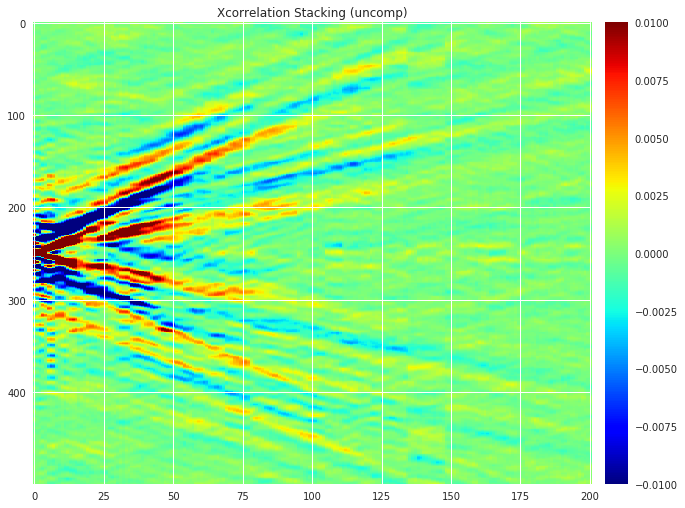

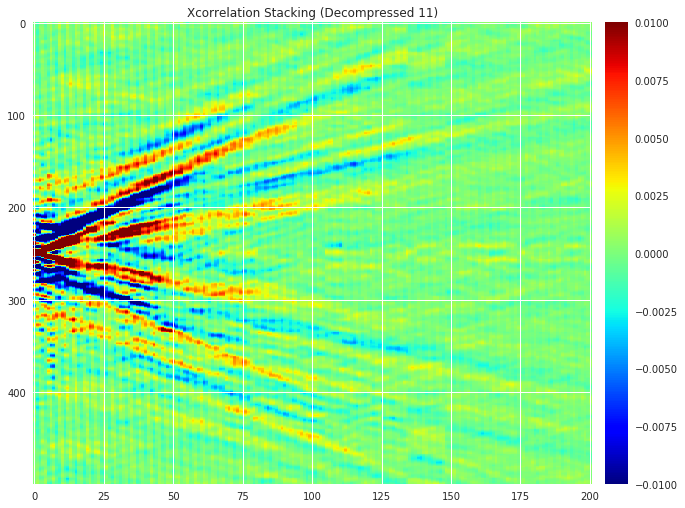

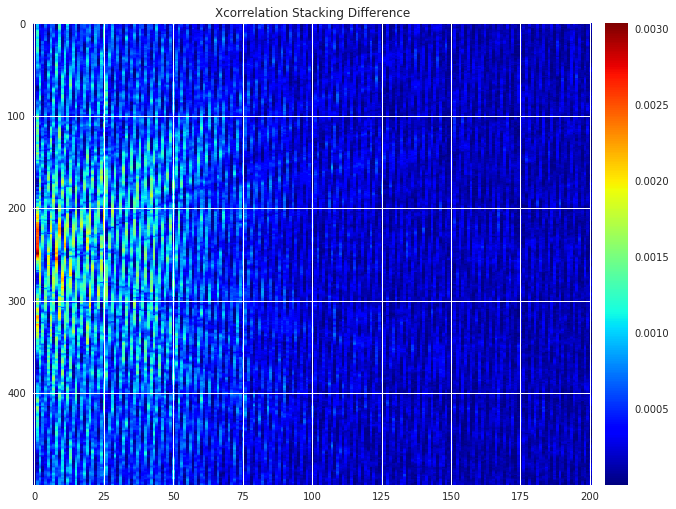

RMSE:  0.0004798091727007104
Relative RMSE:  0.38825385761420156


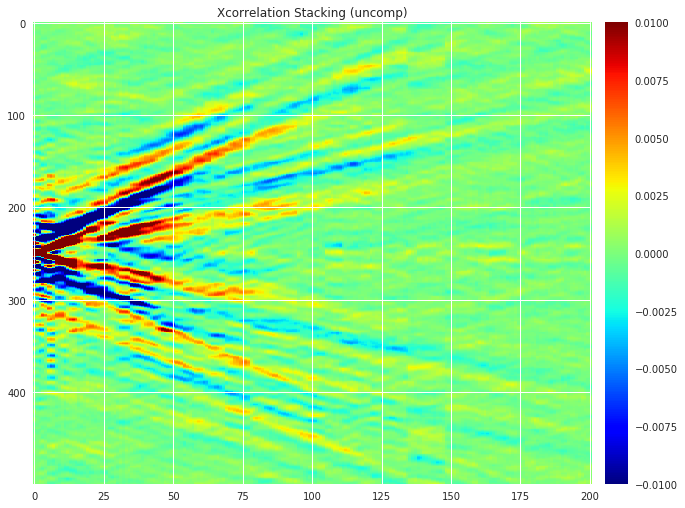

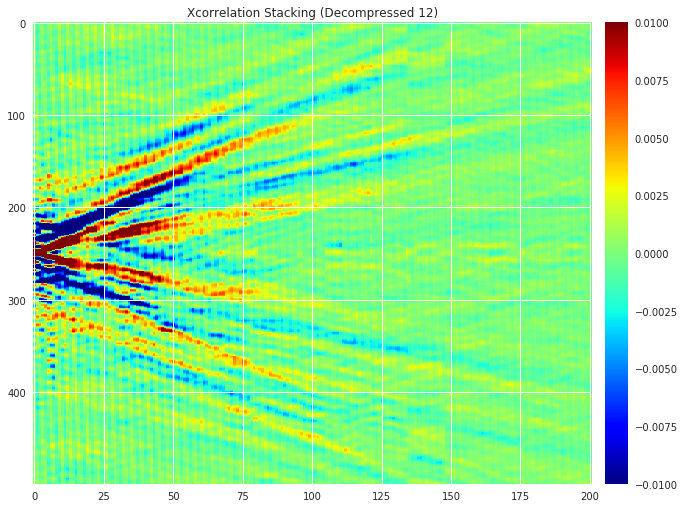

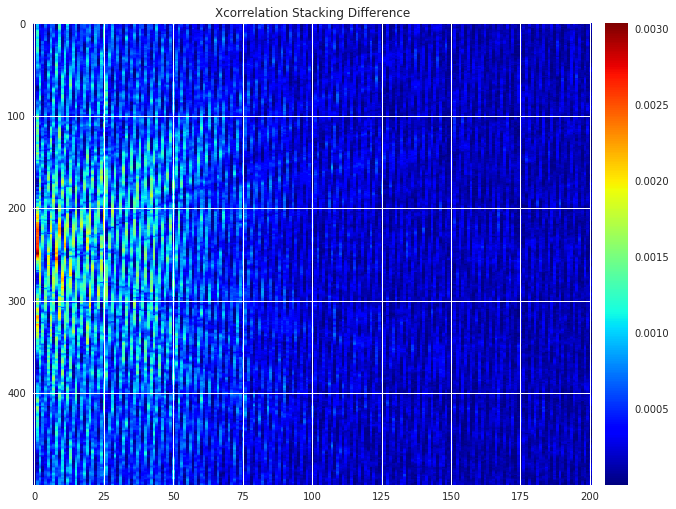

RMSE:  0.0004798163797763558
Relative RMSE:  0.3882596894637798


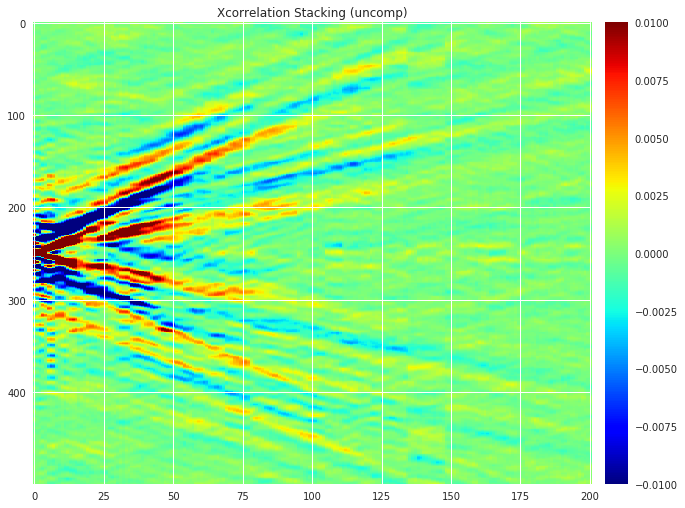

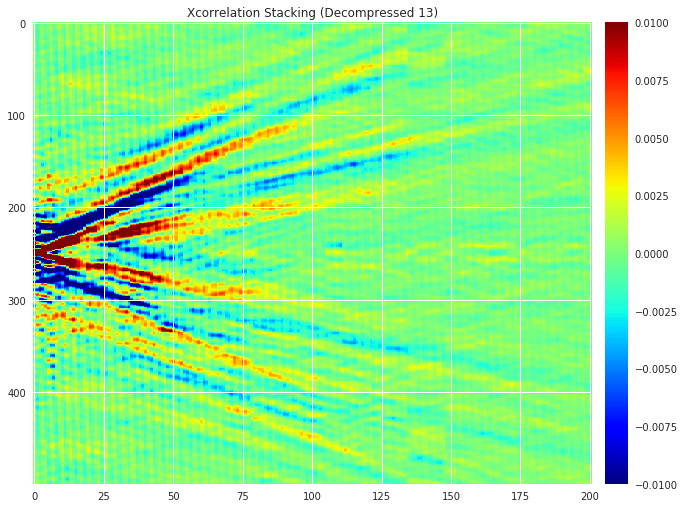

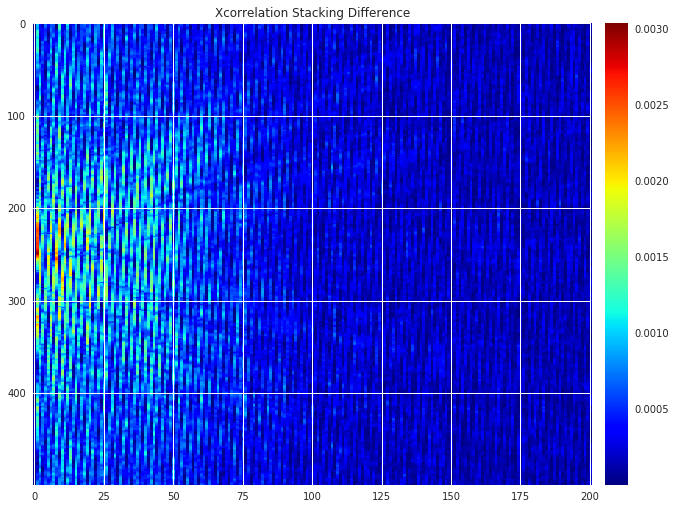

RMSE:  0.0004798148808942116
Relative RMSE:  0.38825847659248075


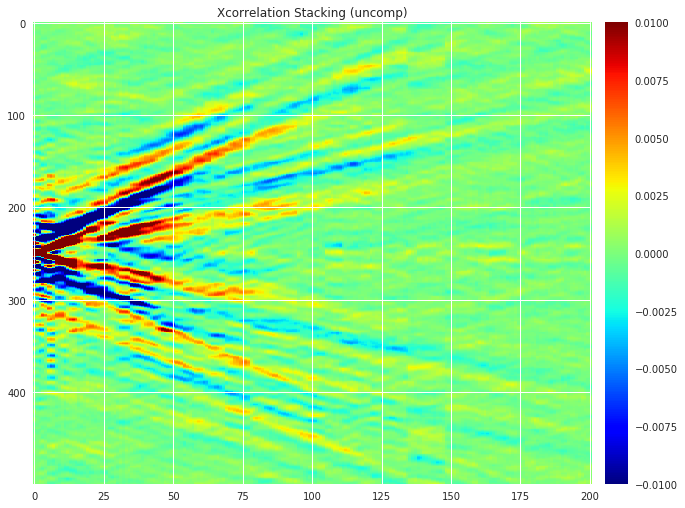

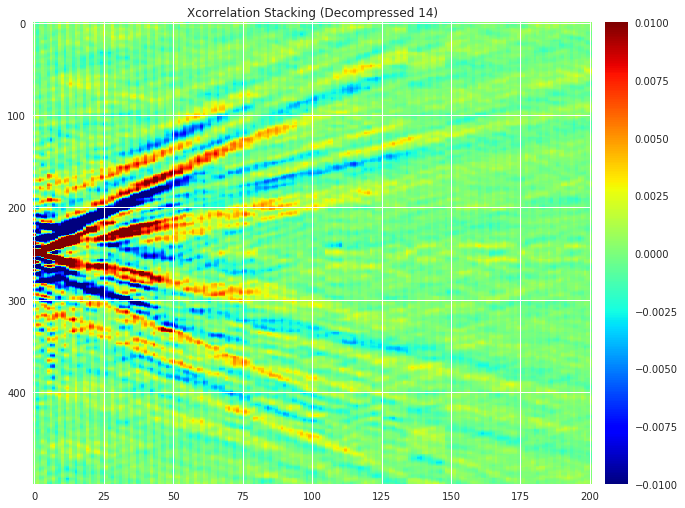

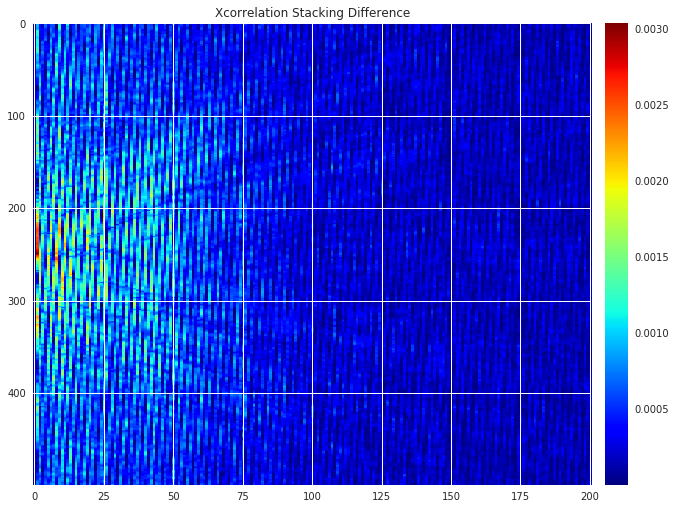

RMSE:  0.0004798148834240647
Relative RMSE:  0.38825847863959717


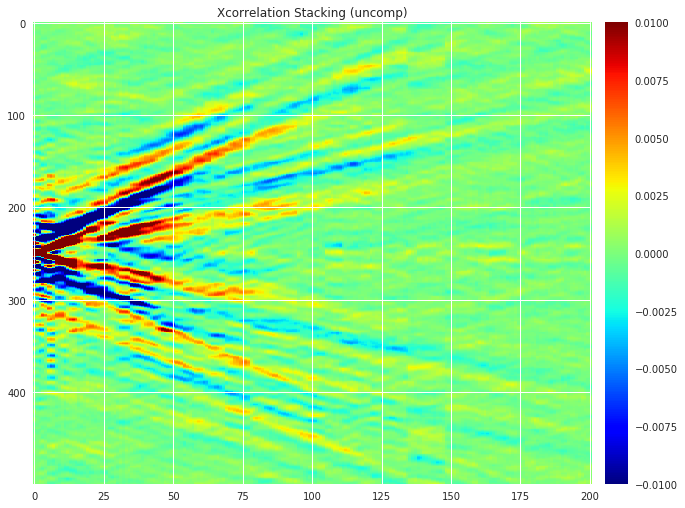

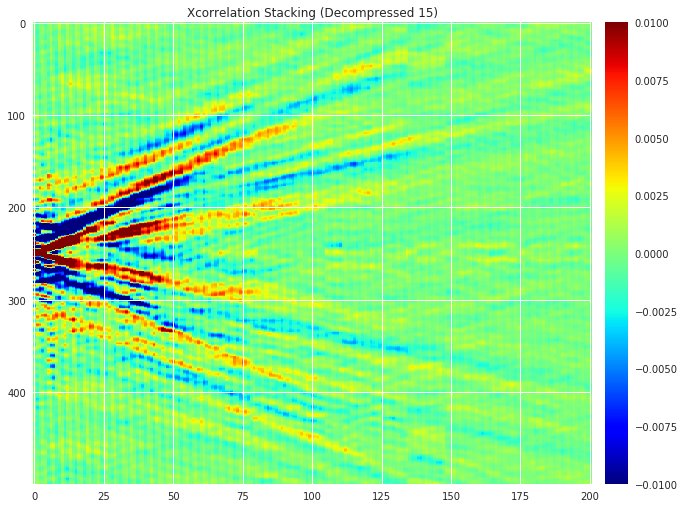

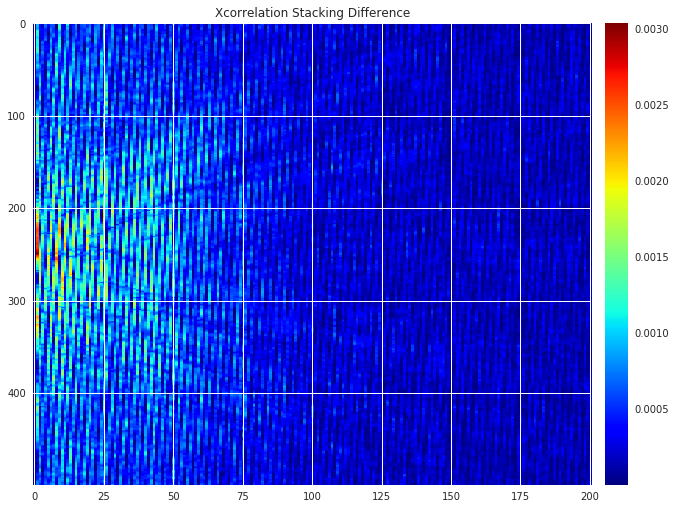

RMSE:  0.00047981488343535613
Relative RMSE:  0.388258478648734


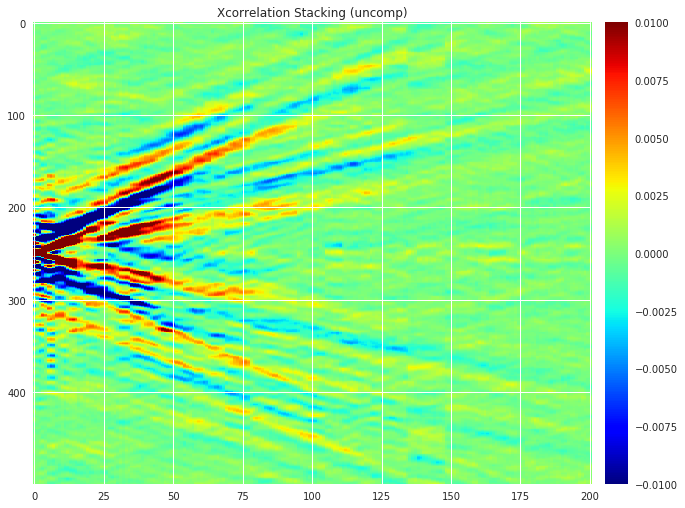

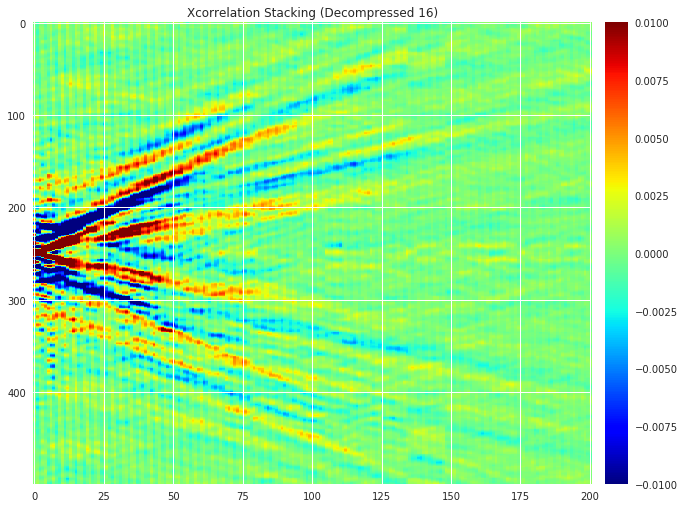

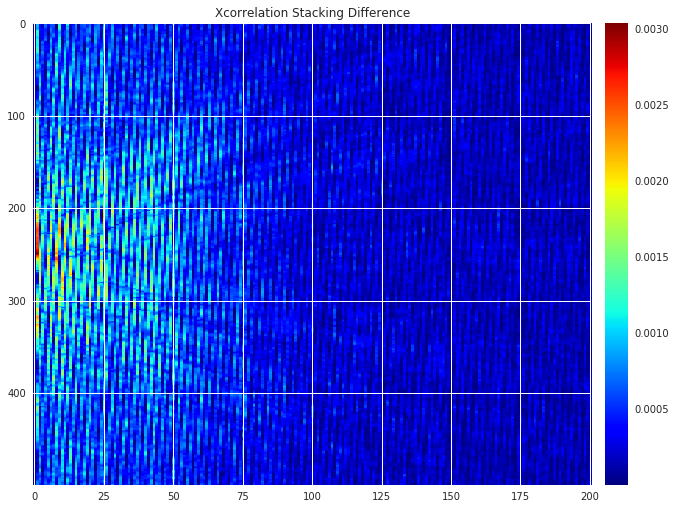

RMSE:  0.00047981488343535613
Relative RMSE:  0.388258478648734


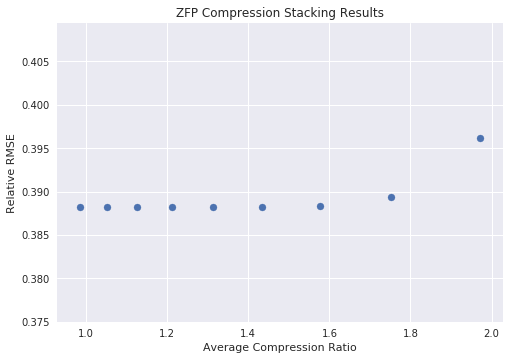

<Figure size 1152x648 with 0 Axes>

In [42]:
generate_stacking_results("../data/")

In [ ]:
stack_rel_rmse_1min = []
with h5.File("../data/xcorr_stack_output_ch4650_4850/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_uncomp:
    data_uncomp = np.transpose(xcorr_uncomp["/data"][:,np.arange(7000, 7750)])
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_0001/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_0001:
    data_decomp0_0001 = np.transpose(xcorr_decomp0_0001["/data"][:,np.arange(7000, 7750)])
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_0001, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.0001)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_0001 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_0001 - data_uncomp)**2)**0.5
abs_mean = np.mean(np.abs(data_uncomp))
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_0005/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_0005:
    data_decomp0_0005 = np.transpose(xcorr_decomp0_0005["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_0005, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.0005)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_0005 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_0005 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_001/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_001:
    data_decomp0_001 = np.transpose(xcorr_decomp0_001["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_001, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.001)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_001 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_001 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_002/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_002:
    data_decomp0_002 = np.transpose(xcorr_decomp0_002["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_002, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.002)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_002 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_002 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_003/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_003:
    data_decomp0_003 = np.transpose(xcorr_decomp0_003["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_003, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.003)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_003 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_003 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_004/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_004:
    data_decomp0_004 = np.transpose(xcorr_decomp0_004["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_004, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.004)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_004 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_004 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_005/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_005:
    data_decomp0_005 = np.transpose(xcorr_decomp0_005["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_005, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.005)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_005 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_005 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_006/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_006:
    data_decomp0_006 = np.transpose(xcorr_decomp0_006["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_006, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.006)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_006 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_006 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_007/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_007:
    data_decomp0_007 = np.transpose(xcorr_decomp0_007["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_007, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.007)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_007 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_007 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_008/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_008:
    data_decomp0_008 = np.transpose(xcorr_decomp0_008["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_008, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.008)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_008 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_008 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_ch4650_4850_0_009/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_009:
    data_decomp0_009 = np.transpose(xcorr_decomp0_009["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_009, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for westSac_180103000031-180103000431 Decompressed (0.009)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_009 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_009 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_1min.append(rmse / abs_mean)

In [ ]:
avg_cmp = data_sz.groupby('err_bound').mean()['cmp_ratio'].tolist()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x=avg_cmp, y=stack_rel_rmse_1min)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Relative RMSE')
plt.title('SZ Compression 1 Min Stacking Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
stack_rel_rmse_5min = []
with h5.File("../data/xcorr_stack_output_30min_ch5500_6000/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_uncomp:
    data_uncomp = np.transpose(xcorr_uncomp["/data"][:,np.arange(7000, 7750)])
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_0001/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_0001:
    data_decomp0_0001 = np.transpose(xcorr_decomp0_0001["/data"][:,np.arange(7000, 7750)])
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_0001, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.0001)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_0001 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_0001 - data_uncomp)**2)**0.5
abs_mean = np.mean(np.abs(data_uncomp))
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_0005/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_0005:
    data_decomp0_0005 = np.transpose(xcorr_decomp0_0005["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_0005, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.0005)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_0005 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_0005 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_001/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_001:
    data_decomp0_001 = np.transpose(xcorr_decomp0_001["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_001, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.001)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_001 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_001 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_002/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_002:
    data_decomp0_002 = np.transpose(xcorr_decomp0_002["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_002, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.002)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_002 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_002 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_003/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_003:
    data_decomp0_003 = np.transpose(xcorr_decomp0_003["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_003, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.003)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_003 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_003 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_004/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_004:
    data_decomp0_004 = np.transpose(xcorr_decomp0_004["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_004, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.004)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_004 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_004 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_005/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_005:
    data_decomp0_005 = np.transpose(xcorr_decomp0_005["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_005, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.005)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_005 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_005 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_006/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_006:
    data_decomp0_006 = np.transpose(xcorr_decomp0_006["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_006, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.006)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_006 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_006 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_007/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_007:
    data_decomp0_007 = np.transpose(xcorr_decomp0_007["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_007, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.007)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_007 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_007 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_008/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_008:
    data_decomp0_008 = np.transpose(xcorr_decomp0_008["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_008, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.008)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_008 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")
plt.show()

rmse = np.mean((data_decomp0_008 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

with h5.File("../data/xcorr_stack_output_30min_ch5500_6000_0_009/xcorr_examples_h5_stack_final_pwstack.h5", "r") as xcorr_decomp0_009:
    data_decomp0_009 = np.transpose(xcorr_decomp0_009["/data"][:,np.arange(7000, 7750)])
    
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_uncomp, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007")
plt.show()
                        
plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(data_decomp0_009, aspect='auto', cmap='jet', vmin=-0.01, vmax=0.01)
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking for Dsi_30min_170803000007-170803030007 Decompressed (0.009)")
plt.show()

plt.style.use('seaborn')
plt.subplots(figsize=(10,7))
plt.imshow(abs(data_decomp0_009 - data_uncomp), aspect='auto', cmap='jet')
plt.colorbar(pad=0.02)
plt.tight_layout()
plt.title("Xcorrelation Stacking Difference")

rmse = np.mean((data_decomp0_009 - data_uncomp)**2)**0.5
print('RMSE: ', rmse)
print('Relative RMSE: ', rmse / abs_mean)
stack_rel_rmse_5min.append(rmse / abs_mean)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)

plt.scatter(x=avg_cmp, y=stack_rel_rmse_5min)

ax.set_xlabel('Compression Ratio')
ax.set_ylabel('Relative RMSE')
plt.title('SZ Compression 5 Min Stacking Results')
plt.style.use('seaborn')
plt.figure(figsize=(16,9))
plt.show()

In [ ]:
df_uncomp = pd.read_csv("../data/westSac_180103000031.csv")
df_decomp = pd.read_csv("../data/westSac_180103000031_decompressed.csv")

In [ ]:
data_uncomp = df_uncomp.iloc[:, 0].tolist()
data_decomp = df_decomp.iloc[:, 0].tolist()

In [ ]:
vals = []
for i in range(len(data_uncomp)):
    vals.append((data_uncomp[i] - data_decomp[i])**2)
np.mean(vals)**0.5